### Setup

Install some dependencies,

In [ ]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Import libraries,

In [1]:
import math

import matplotlib.pyplot as plt
import matplotlib.cm as cm

import numpy as np
from numpy import mean, where

import pandas as pd

import seaborn as sns

from collections import Counter

from sklearn.experimental import enable_iterative_imputer, enable_halving_search_cv

from sklearn.metrics import classification_report, silhouette_score, silhouette_samples
from sklearn import metrics

from sklearn.preprocessing import OrdinalEncoder, StandardScaler
from sklearn.impute import KNNImputer, IterativeImputer, SimpleImputer
from sklearn.feature_selection import SelectKBest
from sklearn.model_selection import GridSearchCV, train_test_split, KFold, cross_val_score, StratifiedKFold, cross_val_predict, cross_validate, HalvingRandomSearchCV, HalvingGridSearchCV
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE, BorderlineSMOTE, SVMSMOTE, ADASYN
from imblearn.under_sampling import RandomUnderSampler, NearMiss

from sklearn.cluster import KMeans

from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, RandomForestRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LinearRegression, Ridge, Lasso

from pandas_profiling import ProfileReport
from sklearn import neural_network as nn

from scipy.stats import randint, uniform
from mlxtend.evaluate import paired_ttest_5x2cv

from pandas.plotting import scatter_matrix

sns.set_theme()


Read dataset,

In [3]:
url = "https://drive.google.com/file/d/1ICwWkJ2ufuONNnI26NCNv2_LLxxfdzg-/view?usp=share_link"
dwn_url='https://drive.google.com/uc?id=' + url.split('/')[-2]
data_raw = pd.read_csv(dwn_url)

Define some helper functions,

In [7]:
def display_missing(df: pd.DataFrame):
    col_na = df.isnull().sum().sort_values(ascending=False)
    percent = col_na / len(df)
    
    missing_data = pd.concat([col_na, percent], axis=1, keys=['Total', 'Percent'])
    print(missing_data[missing_data['Total'] > 0]) if missing_data[missing_data['Total'] > 0].shape[0] != 0 else print('No missing value found')

def display_outliers(df: pd.DataFrame):
    q3 = df.quantile(0.75)
    q1 = df.quantile(0.25)
    iqr = q3 - q1
    outlier_count = ((df < (q1 - 1.5 * iqr)) | (df > (q3 + 1.5 * iqr))).sum()

    display(outlier_count)
    print(f'Number of outliers = {outlier_count.sum()}')

### Dataset description

#### General

- Property_ID : Unique ID of a property.
- Property_Type : Type of property.
- Property_Area : Property area in foot squared.
- Number_of_Windows : Number of windows in a property.
- Number_of_Doors : Number of doors in a property.
- Furnishing : Type of furnishings in a property.
- Frequency_of_Powercuts : Average number of powercuts in a week.
- Power_Backup : Access to backup power.
- Water_Supply : Access to a water supply.
- Traffic_Density_Score : Level of traffic density surrounding the property.
- Crime_Rate : Crime rate in the property's general area .
- Dust_and_Noise : Level of dust and sound pollution in the property's general area.
- Air_Quality_Index: The air quality index in the property's general area.
- Neighborhood_Review: Average review score given to the property's general area.
- Habitability_category: The habitability category of a property.

In [ ]:
data_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39499 entries, 0 to 39498
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Property_ID             39499 non-null  object 
 1   Property_Type           39499 non-null  object 
 2   Property_Area           39499 non-null  int64  
 3   Number_of_Windows       37845 non-null  float64
 4   Number_of_Doors         39499 non-null  int64  
 5   Furnishing              38457 non-null  object 
 6   Frequency_of_Powercuts  38116 non-null  float64
 7   Power_Backup            39499 non-null  object 
 8   Water_Supply            39499 non-null  object 
 9   Traffic_Density_Score   39499 non-null  float64
 10  Crime_Rate              38712 non-null  object 
 11  Dust_and_Noise          38280 non-null  object 
 12  Air_Quality_Index       39499 non-null  float64
 13  Neighborhood_Review     39499 non-null  float64
 14  Habitability_category   39499 non-null

In [ ]:
data_raw.shape

(39499, 15)

In [ ]:
data_raw

,Property_ID,Property_Type,Property_Area,Number_of_Windows,Number_of_Doors,Furnishing,Frequency_of_Powercuts,Power_Backup,Water_Supply,Traffic_Density_Score,Crime_Rate,Dust_and_Noise,Air_Quality_Index,Neighborhood_Review,Habitability_category
0,0x21e3,Apartment,106,NaN,1,Semi_Furnished,0.0,No,Once in a day - Morning,5.89,Slightly below average,Medium,90.0,3.86,High
1,0x68d4,Apartment,733,2.0,2,Unfurnished,1.0,No,Once in a day - Evening,4.37,Well below average,Medium,96.0,3.55,High
2,0x7d81,Apartment,737,4.0,2,Fully Furnished,0.0,No,Once in a day - Morning,7.45,Slightly below average,Medium,121.0,3.81,High
3,0x7a57,Apartment,900,3.0,2,Unfurnished,2.0,Yes,Once in a day - Morning,6.16,Well above average,Medium,100.0,1.34,Low
4,0x9409,Bungalow,2238,14.0,6,Fully Furnished,0.0,No,All time,5.46,Well below average,Medium,116.0,4.77,High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39494,0x6e26,Single-family home,1120,3.0,2,NaN,0.0,No,All time,5.55,Slightly above average,Medium,80.0,3.56,High
39495,0xa013,Apartment,445,1.0,3,Fully Furnished,1.0,No,All time,5.70,Slightly above average,Medium,86.0,2.93,High
39496,0x9721,Bungalow,3780,6.0,6,Unfurnished,0.0,Yes,Once in two days,6.84,Well below average,Medium,137.0,3.80,High
39497,0x7e25,Single-family home,1266,3.0,1,Semi_Furnished,0.0,No,Once in a day - Morning,4.60,Slightly above average,NaN,88.0,3.25,High


In [ ]:
data_raw.describe()

,Property_Area,Number_of_Windows,Number_of_Doors,Frequency_of_Powercuts,Traffic_Density_Score,Air_Quality_Index,Neighborhood_Review
count,39499.000000,37845.000000,39499.000000,38116.000000,39499.000000,39499.000000,39499.000000
mean,1391.715638,3.923768,2.331375,0.484678,6.354772,121.352566,3.735945
std,1953.287544,2.690992,1.179964,0.752207,1.219681,62.384669,0.796843
min,100.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,494.000000,2.000000,1.000000,0.000000,5.600000,95.000000,3.220000
50%,932.000000,4.000000,2.000000,0.000000,6.470000,113.000000,3.850000
75%,1770.000000,5.000000,3.000000,1.000000,7.220000,140.000000,4.260000
max,28064.000000,15.000000,6.000000,3.000000,9.910000,1044.000000,5.000000


In [ ]:
data_raw.describe(include=object)

,Property_ID,Property_Type,Furnishing,Power_Backup,Water_Supply,Crime_Rate,Dust_and_Noise,Habitability_category
count,39499,39499,38457,39499,39499,38712,38280,39499
unique,39499,6,3,3,5,4,3,3
top,0x21e3,Apartment,Semi_Furnished,No,All time,Well below average,Medium,High
freq,1,14596,20357,29714,19511,19472,32996,29220


#### Show the number of data points in each category for each categorical feature

In [ ]:
print(f"{data_raw['Property_Type'].value_counts()}\n")
print(f"{data_raw['Furnishing'].value_counts()}\n")
print(f"{data_raw['Power_Backup'].value_counts()}\n")
print(f"{data_raw['Water_Supply'].value_counts()}\n")
print(f"{data_raw['Crime_Rate'].value_counts()}\n")
print(f"{data_raw['Dust_and_Noise'].value_counts()}\n")
print(f"{data_raw['Habitability_category'].value_counts()}\n")

Apartment             14596
Single-family home    11477
Duplex                 5806
Bungalow               4238
Container Home         2872
#R%$G&867               510
Name: Property_Type, dtype: int64

Semi_Furnished     20357
Unfurnished        10344
Fully Furnished     7756
Name: Furnishing, dtype: int64

No               29714
Yes               8957
NOT MENTIONED      828
Name: Power_Backup, dtype: int64

All time                   19511
Once in a day - Morning     9897
Once in a day - Evening     7815
Once in two days            1931
NOT MENTIONED                345
Name: Water_Supply, dtype: int64

Well below average        19472
Slightly below average    11580
Slightly above average     5303
Well above average         2357
Name: Crime_Rate, dtype: int64

Medium    32996
High       3212
Low        2072
Name: Dust_and_Noise, dtype: int64

High      29220
Middle     7997
Low        2282
Name: Habitability_category, dtype: int64



#### Show the number of missing values

In [ ]:
display_missing(data_raw)

                        Total   Percent
Number_of_Windows        1654  0.041874
Frequency_of_Powercuts   1383  0.035014
Dust_and_Noise           1219  0.030862
Furnishing               1042  0.026380
Crime_Rate                787  0.019925


#### Show the number of outliers in the dataset

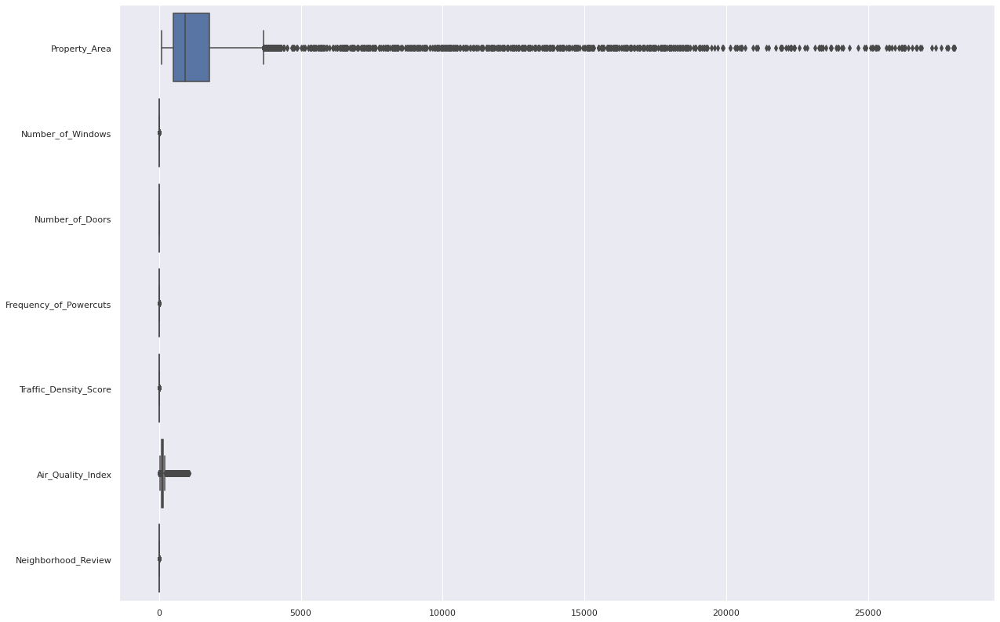

In [ ]:
plt.figure(figsize=(20, 14))
sns.boxplot(data=data_raw, orient="h")
plt.show()

In [ ]:
display_outliers(data_raw)

<ipython-input-5-c214df816f35>:12: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version.  Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  outlier_count = ((df < (q1 - 1.5 * iqr)) | (df > (q3 + 1.5 * iqr))).sum()


Air_Quality_Index          791
Crime_Rate                   0
Dust_and_Noise               0
Frequency_of_Powercuts    1194
Furnishing                   0
Habitability_category        0
Neighborhood_Review        623
Number_of_Doors              0
Number_of_Windows         1994
Power_Backup                 0
Property_Area             1694
Property_ID                  0
Property_Type                0
Traffic_Density_Score      538
Water_Supply                 0
dtype: int64

Jumlah outlier-outlier: 6834


#### Show the number of duplicate data points

In [6]:
print(f'Number of duplicated data points = {data_raw.duplicated(keep=False).sum()}')

Number of duplicated data points = 0


Note there are no duplicate data points in this dataset.

#### Preliminary profile report

In [ ]:
profile_raw = ProfileReport(data_raw)
profile_raw

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Data Preprocessing

In [9]:
data = data_raw.copy()

#### Data Imputation

##### Remove useless features

In [10]:
data.drop(['Property_ID'], axis=1, inplace=True)

##### Remove invalid data points that was not gathered correctly

In [11]:
data.drop(data[data['Property_Type'] == '#R%$G&867'].index, inplace=True)
data.drop(data[data['Power_Backup'] == 'NOT MENTIONED'].index, inplace=True)
data.drop(data[data['Water_Supply'] == 'NOT MENTIONED'].index, inplace=True)

data.shape

(37847, 14)

Wiped about 2000 data points

##### Imputate missing values

In [12]:
# imputasi data numerik
imp_mean = IterativeImputer(random_state=0,imputation_order='ascending')
data[['Number_of_Windows', 'Frequency_of_Powercuts']]=imp_mean.fit_transform(data[['Number_of_Windows', 'Frequency_of_Powercuts']])

# imputasi data kategorikal
si = SimpleImputer(strategy='most_frequent')
data[['Furnishing', 'Crime_Rate', 'Dust_and_Noise']]=si.fit_transform(data[['Furnishing', 'Crime_Rate', 'Dust_and_Noise']])
data

,Property_Type,Property_Area,Number_of_Windows,Number_of_Doors,Furnishing,Frequency_of_Powercuts,Power_Backup,Water_Supply,Traffic_Density_Score,Crime_Rate,Dust_and_Noise,Air_Quality_Index,Neighborhood_Review,Habitability_category
0,Apartment,106,3.927051,1,Semi_Furnished,0.0,No,Once in a day - Morning,5.89,Slightly below average,Medium,90.0,3.86,High
1,Apartment,733,2.000000,2,Unfurnished,1.0,No,Once in a day - Evening,4.37,Well below average,Medium,96.0,3.55,High
2,Apartment,737,4.000000,2,Fully Furnished,0.0,No,Once in a day - Morning,7.45,Slightly below average,Medium,121.0,3.81,High
3,Apartment,900,3.000000,2,Unfurnished,2.0,Yes,Once in a day - Morning,6.16,Well above average,Medium,100.0,1.34,Low
4,Bungalow,2238,14.000000,6,Fully Furnished,0.0,No,All time,5.46,Well below average,Medium,116.0,4.77,High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39494,Single-family home,1120,3.000000,2,Semi_Furnished,0.0,No,All time,5.55,Slightly above average,Medium,80.0,3.56,High
39495,Apartment,445,1.000000,3,Fully Furnished,1.0,No,All time,5.70,Slightly above average,Medium,86.0,2.93,High
39496,Bungalow,3780,6.000000,6,Unfurnished,0.0,Yes,Once in two days,6.84,Well below average,Medium,137.0,3.80,High
39497,Single-family home,1266,3.000000,1,Semi_Furnished,0.0,No,Once in a day - Morning,4.60,Slightly above average,Medium,88.0,3.25,High


In [13]:
display_missing(data)

No missing value found


#### Encoding

##### One-hot encoding for nominal data

In [16]:
data = pd.get_dummies(data, columns=['Property_Type'])
data = pd.get_dummies(data, drop_first=True, columns=['Power_Backup'])

data.tail()

,Property_Area,Number_of_Windows,Number_of_Doors,Furnishing,Frequency_of_Powercuts,Water_Supply,Traffic_Density_Score,Crime_Rate,Dust_and_Noise,Air_Quality_Index,Neighborhood_Review,Habitability_category,Property_Type_Apartment,Property_Type_Bungalow,Property_Type_Container Home,Property_Type_Duplex,Property_Type_Single-family home,Power_Backup_Yes
39494,1120,3.0,2,Semi_Furnished,0.0,All time,5.55,Slightly above average,Medium,80.0,3.56,High,0,0,0,0,1,0
39495,445,1.0,3,Fully Furnished,1.0,All time,5.70,Slightly above average,Medium,86.0,2.93,High,1,0,0,0,0,0
39496,3780,6.0,6,Unfurnished,0.0,Once in two days,6.84,Well below average,Medium,137.0,3.80,High,0,1,0,0,0,1
39497,1266,3.0,1,Semi_Furnished,0.0,Once in a day - Morning,4.60,Slightly above average,Medium,88.0,3.25,High,0,0,0,0,1,0
39498,1229,2.0,4,Fully Furnished,0.0,All time,8.29,Well below average,High,132.0,4.67,High,0,0,0,0,1,0


##### Ordinal encoding for ordinal data

In [17]:
# data_raw.select_dtypes(include='object').columns.values

column_categories = {
    'Furnishing': ['Unfurnished', 'Semi_Furnished', 'Fully Furnished'],
    'Water_Supply': ['Once in two days', 'Once in a day - Evening', 'Once in a day - Morning', 'All time'],
    'Crime_Rate': ['Well below average', 'Slightly below average', 'Slightly above average', 'Well above average'],
    'Dust_and_Noise': ['Low', 'Medium', 'High'],
    'Habitability_category': ['Low', 'Middle', 'High']
}

for column, categories in column_categories.items():
  enc = OrdinalEncoder(categories=[categories])
  data[column] = enc.fit_transform(data[column].to_numpy().reshape(-1, 1))

data.tail()

,Property_Area,Number_of_Windows,Number_of_Doors,Furnishing,Frequency_of_Powercuts,Water_Supply,Traffic_Density_Score,Crime_Rate,Dust_and_Noise,Air_Quality_Index,Neighborhood_Review,Habitability_category,Property_Type_Apartment,Property_Type_Bungalow,Property_Type_Container Home,Property_Type_Duplex,Property_Type_Single-family home,Power_Backup_Yes
39494,1120,3.0,2,1.0,0.0,3.0,5.55,2.0,1.0,80.0,3.56,2.0,0,0,0,0,1,0
39495,445,1.0,3,2.0,1.0,3.0,5.70,2.0,1.0,86.0,2.93,2.0,1,0,0,0,0,0
39496,3780,6.0,6,0.0,0.0,0.0,6.84,0.0,1.0,137.0,3.80,2.0,0,1,0,0,0,1
39497,1266,3.0,1,1.0,0.0,2.0,4.60,2.0,1.0,88.0,3.25,2.0,0,0,0,0,1,0
39498,1229,2.0,4,2.0,0.0,3.0,8.29,0.0,2.0,132.0,4.67,2.0,0,0,0,0,1,0


##### Final profile report

In [ ]:
profile = ProfileReport(data)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Exploratory Data Analysis

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 37847 entries, 0 to 39498
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Property_Area                     37847 non-null  int64  
 1   Number_of_Windows                 37847 non-null  float64
 2   Number_of_Doors                   37847 non-null  int64  
 3   Furnishing                        37847 non-null  float64
 4   Frequency_of_Powercuts            37847 non-null  float64
 5   Water_Supply                      37847 non-null  float64
 6   Traffic_Density_Score             37847 non-null  float64
 7   Crime_Rate                        37847 non-null  float64
 8   Dust_and_Noise                    37847 non-null  float64
 9   Air_Quality_Index                 37847 non-null  float64
 10  Neighborhood_Review               37847 non-null  float64
 11  Habitability_category             37847 non-null  float64
 12  Prop

#### What is the average Neighborhood_Review score for every Crime_Rate category?

> Crime_Rate:
> - 0	= Well below average
> - 1	= Slightly below average
> - 2	= Slightly above average
> - 3	= Well above average

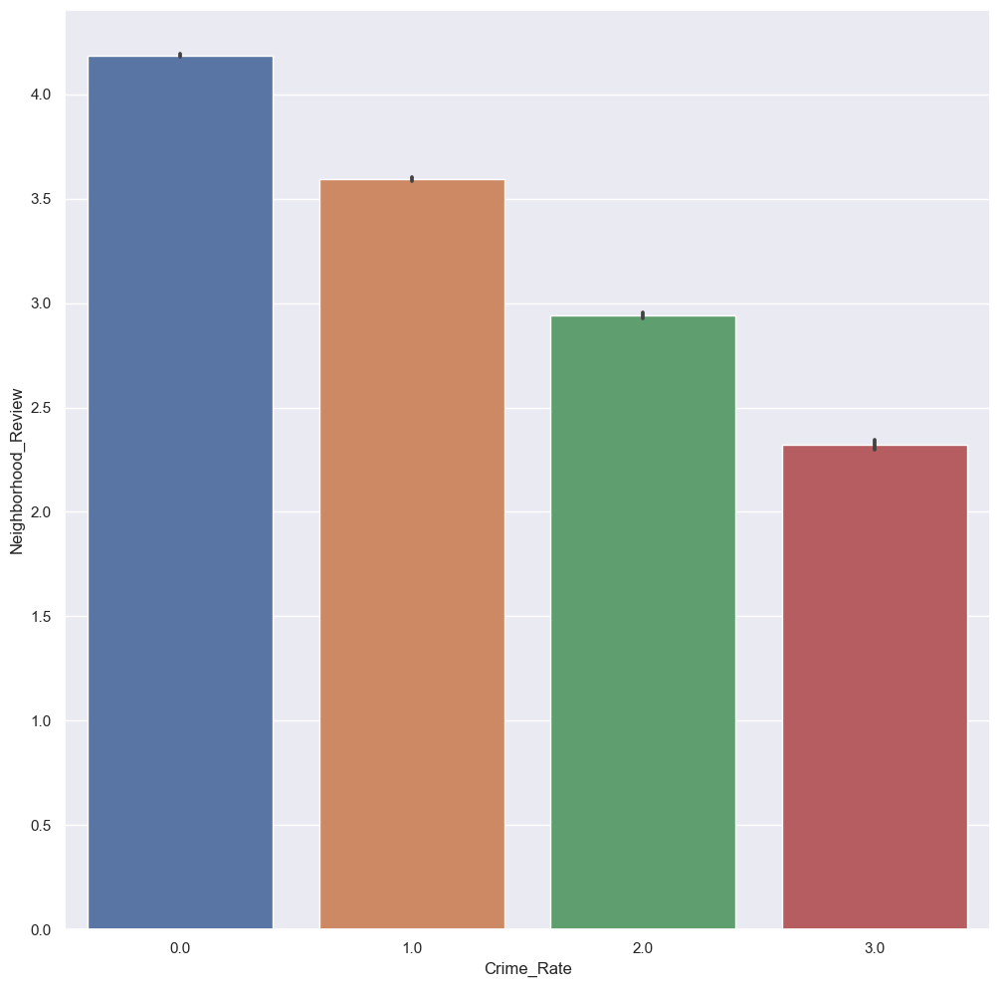

In [18]:
plt.figure(figsize=(12, 12))
sns.barplot(data=data, x='Crime_Rate', y='Neighborhood_Review')
plt.show()

In [ ]:
data.groupby('Crime_Rate', as_index=False)['Neighborhood_Review'].mean()

,Crime_Rate,Neighborhood_Review
0,0.00,4.19
1,1.00,3.59
2,2.00,2.94
3,3.00,2.32


> As seen on the table and visualized by the barplot above, higher evaluation of a property means lower crime rate around that property, and vice versa.

#### What are the characteristics of properties with "High" Habitability_category?

> Habitability_category:
> - 0	= Low
> - 1	= Middle
> - 2	= High
>
> Furnishing:
> - 0	= Unfurnished
> - 1	= Semi_Furnished
> - 2	= Fully Furnished

In [19]:
print('Mean of numerical features grouped by its habitability category,')
display(data.groupby('Habitability_category').agg({'Property_Area': 'mean', 'Neighborhood_Review': 'mean', 'Number_of_Windows': 'mean', 'Number_of_Doors': 'mean', 'Frequency_of_Powercuts': 'mean', 'Traffic_Density_Score': 'mean', 'Air_Quality_Index': 'mean'}).sort_values(by=['Habitability_category'], ascending=[False]).round(2))

print('\nMode of numerical features grouped by its habitability category,')
display(data.groupby('Habitability_category').agg({'Property_Area': pd.Series.mode, 'Neighborhood_Review': pd.Series.mode, 'Number_of_Windows': pd.Series.mode, 'Number_of_Doors': pd.Series.mode, 'Frequency_of_Powercuts': pd.Series.mode, 'Traffic_Density_Score': pd.Series.mode, 'Air_Quality_Index': pd.Series.mode}).sort_values(by=['Habitability_category'], ascending=[False]).round(2))

print('\nMedian of numerical features grouped by its habitability category,')
display(data.groupby('Habitability_category').agg({'Property_Area': 'median', 'Neighborhood_Review': 'median', 'Number_of_Windows': 'median', 'Number_of_Doors': 'median', 'Frequency_of_Powercuts': 'median', 'Traffic_Density_Score': 'median', 'Air_Quality_Index': 'median'}).sort_values(by=['Habitability_category'], ascending=[False]).round(2))

Mean of numerical features grouped by its habitability category,


,Property_Area,Neighborhood_Review,Number_of_Windows,Number_of_Doors,Frequency_of_Powercuts,Traffic_Density_Score,Air_Quality_Index
Habitability_category,,,,,,,
2.0,1451.50,3.94,4.05,2.38,0.41,6.32,120.08
1.0,1259.83,3.36,3.64,2.22,0.63,6.40,123.39
0.0,1054.87,2.43,3.33,2.15,1.01,6.67,130.01



Mode of numerical features grouped by its habitability category,


,Property_Area,Neighborhood_Review,Number_of_Windows,Number_of_Doors,Frequency_of_Powercuts,Traffic_Density_Score,Air_Quality_Index
Habitability_category,,,,,,,
2.0,474,4.17,4.0,2,0.0,6.2,112.0
1.0,"[419, 487]",3.54,4.0,2,0.0,"[5.92, 6.87]",102.0
0.0,242,2.90,4.0,2,0.0,6.2,107.0



Median of numerical features grouped by its habitability category,


,Property_Area,Neighborhood_Review,Number_of_Windows,Number_of_Doors,Frequency_of_Powercuts,Traffic_Density_Score,Air_Quality_Index
Habitability_category,,,,,,,
2.0,988.0,4.11,3.93,2.0,0.0,6.45,112.0
1.0,807.0,3.47,3.00,2.0,0.0,6.46,113.0
0.0,689.0,2.51,3.00,2.0,1.0,6.72,122.0


> In summary, properties that have "High" Habitability_category:
> - Have a mean area of 1451.50 feet<sup>2</sup>, mode area of 474 feet<sup>2</sup>, and median area of 988 feet<sup>2</sup>, which overall are higher than the other categories.
> - Score higher reviews on average than all the other categories, with a mean score of 3.94 out of 5.00.
> - Have 4 windows dan 2 doors on average.
> - Have a mean frequency of powercuts of 0.41, smallest among all the categories.
> - Have more or less the same average traffic density score and air quality index score as all the other categories.

Below are visualizations of Habitability_Category in relation with other features,

<Figure size 864x864 with 0 Axes>

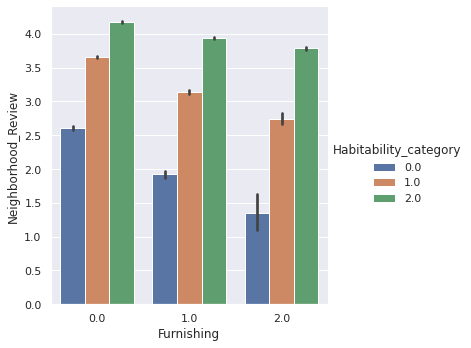

In [ ]:
plt.figure(figsize=(12, 12))
sns.catplot(data=data, kind='bar', x='Furnishing', y='Neighborhood_Review', hue='Habitability_category')
plt.show()

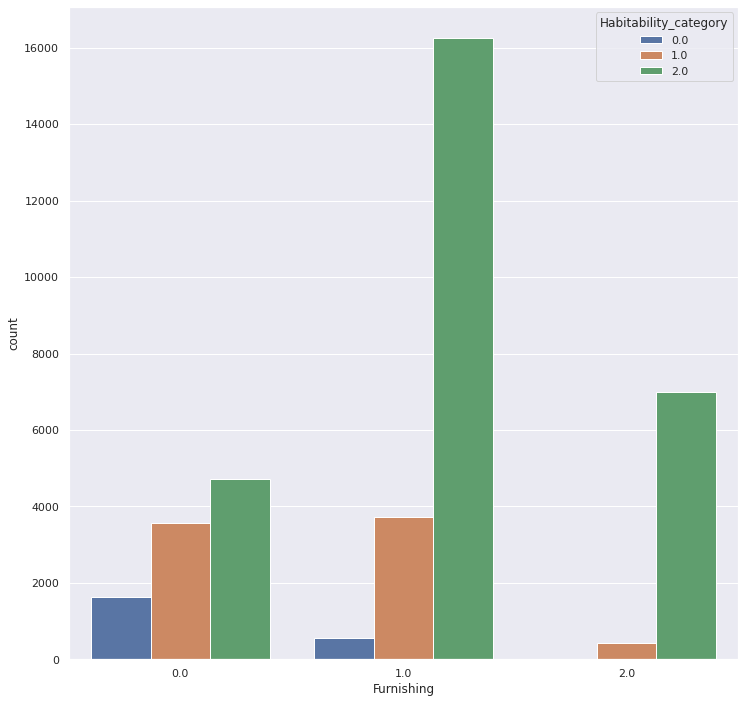

In [ ]:
plt.figure(figsize=(12, 12))
sns.countplot(data=data, x='Furnishing', hue='Habitability_category')
plt.show()

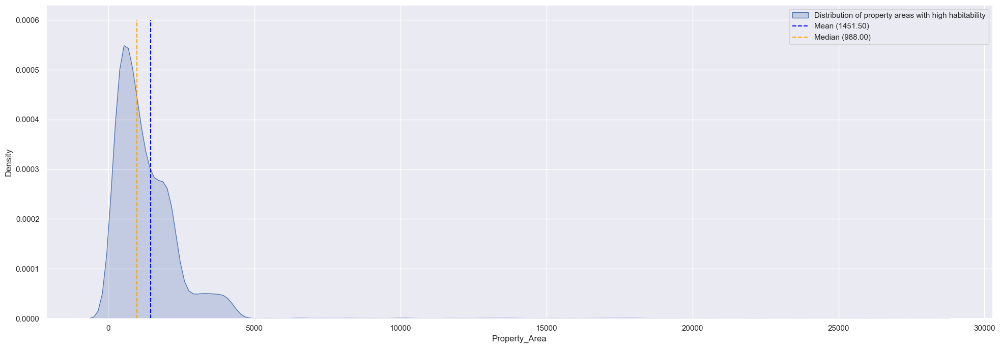

In [21]:
plt.figure(figsize=(24, 8))
sns.kdeplot(data=data[data['Habitability_category'] == 2], x='Property_Area', fill=True)
plt.vlines(x=data[data['Habitability_category'] == 2]['Property_Area'].mean(), ymin=0, ymax=0.0006, color='blue', linestyle='--')
plt.vlines(x=data[data['Habitability_category'] == 2]['Property_Area'].median(), ymin=0, ymax=0.0006, color='orange', linestyle='--')
plt.legend(['Distribution of property areas with high habitability', f"Mean ({data[data['Habitability_category'] == 2]['Property_Area'].mean():.2f})", f"Median ({data[data['Habitability_category'] == 2]['Property_Area'].median():.2f})"])
plt.show()

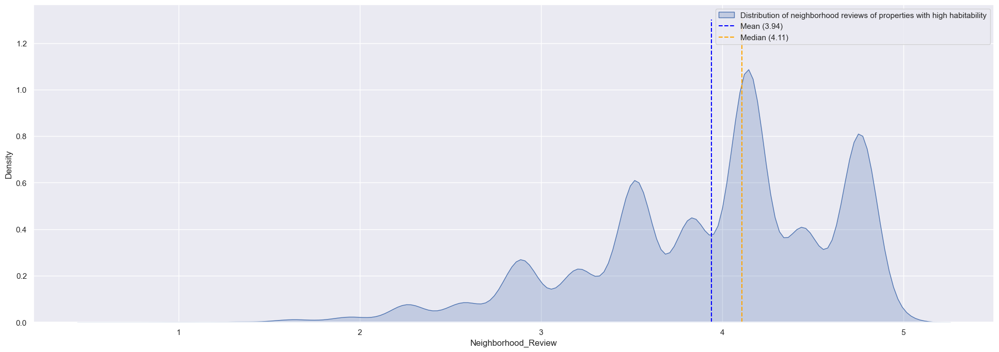

In [24]:
plt.figure(figsize=(24, 8))
sns.kdeplot(data=data[data['Habitability_category'] == 2], x='Neighborhood_Review', fill=True)
plt.vlines(x=data[data['Habitability_category'] == 2]['Neighborhood_Review'].mean(), ymin=0, ymax=1.3, color='blue', linestyle='--')
plt.vlines(x=data[data['Habitability_category'] == 2]['Neighborhood_Review'].median(), ymin=0, ymax=1.3, color='orange', linestyle='--')
plt.legend(['Distribution of neighborhood reviews of properties with high habitability', f"Mean ({data[data['Habitability_category'] == 2]['Neighborhood_Review'].mean():.2f})", f"Median ({data[data['Habitability_category'] == 2]['Neighborhood_Review'].median():.2f})"])
plt.show()

#### Are Traffic_Density_Score and Crime_Rate correlated?

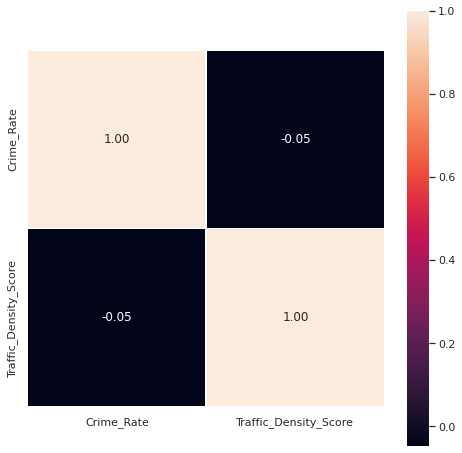

In [ ]:
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(data[['Crime_Rate', 'Traffic_Density_Score']].corr(method='pearson'), annot=True, linewidths=.5, fmt= '.2f', square=True, ax=ax)
plt.show()

> Based on the Pearson correlation value between Crime_Rate and Traffic_Density_Score (-0.05), there is almost zero correlation between these two features.

> The following is a visualization of the correlation between these two features using a violin plot and a scatter plot with added jitter. Take note that there is no diagonal line visible that shows a correlation between Crime_Rate and Traffic_Density_Score. The points on the scatterplot roughly form a straight vertical line.

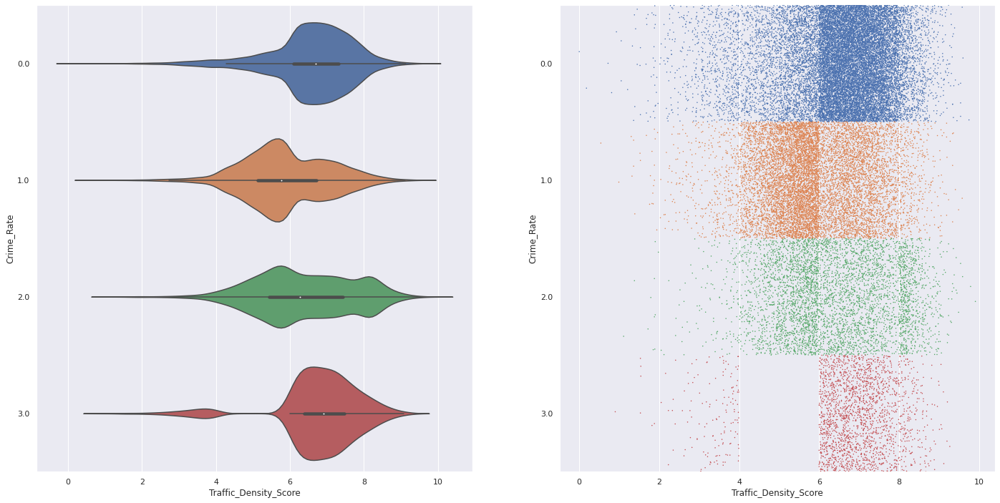

In [ ]:
plt.figure(figsize=(24, 12))
plt.subplot(121)
sns.violinplot(data=data, y='Crime_Rate', x='Traffic_Density_Score', orient='h')
plt.subplot(122)
sns.stripplot(data=data, y='Crime_Rate', x='Traffic_Density_Score', jitter=0.5, size=1.5, orient='h')
plt.show()

#### Is there running water available for homes with backup power?

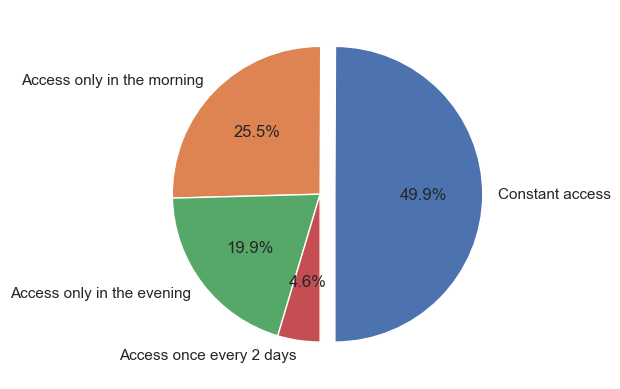

In [25]:
pb = data[data['Power_Backup_Yes']==1]
water_supply = pb['Water_Supply'].value_counts()
water_supply

myexplode = [0.1, 0, 0, 0]
keterangan = ['Constant access','Access only in the morning','Access only in the evening','Access once every 2 days']
plt.pie(water_supply, labels = keterangan, startangle = 270, autopct='%1.1f%%', explode=myexplode)
plt.show() 

From the pie chart above, only roughly 50% of all the properties with access to a backup power have access to water throughout the day. The remaining 50% rarely have easy access to water.

#### Does the ratio of number of windows to property area influence a property's habitability rating?

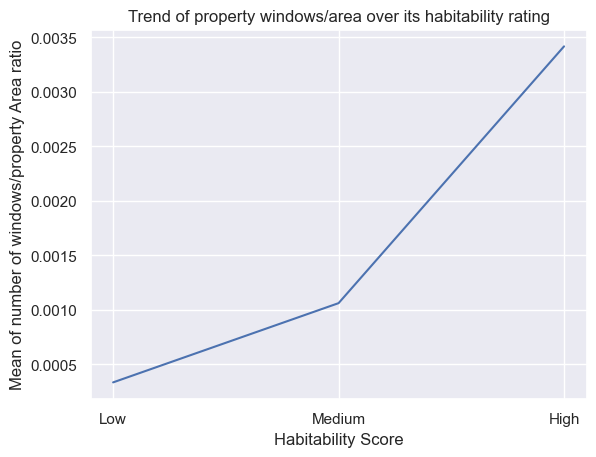

In [26]:
nowpa = data.Number_of_Windows / data.Property_Area
windows = pd.DataFrame()
windows['low'] = nowpa.where(data.Habitability_category == 0.00, other=0)
windows['medium'] = nowpa.where(data.Habitability_category == 1.00, other=0)
windows['high'] = nowpa.where(data.Habitability_category == 2.00, other=0)

x_axis = ['Low', 'Medium', 'High']
y_axis = [windows['low'].mean(), windows['medium'].mean(), windows['high'].mean()]

plt.plot(x_axis, y_axis)
plt.title('Trend of property windows/area over its habitability rating')
plt.xlabel('Habitability Score')
plt.ylabel('Mean of number of windows/property Area ratio')
plt.show()

The line chart above suggests that the habitability rating increases as the ratio increases. This can mean either 2 things, 
- People have a preference towards more windows in their property, or,
- The number of windows for every unit area of a property influences its habitability.

#### Does traffic density influence air quality, sound pollution, and dust levels?

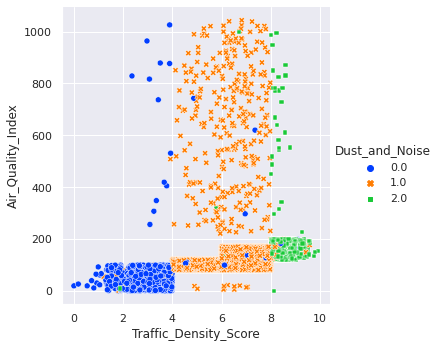

In [ ]:
sns.relplot(x ="Traffic_Density_Score", y ="Air_Quality_Index",
            hue ="Dust_and_Noise", style ="Dust_and_Noise", 
            data = data,
            palette='bright');

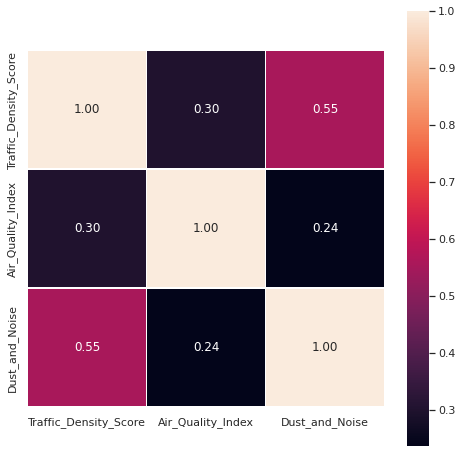

In [ ]:
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(data[['Traffic_Density_Score', 'Air_Quality_Index', 'Dust_and_Noise']].corr(method='pearson'), annot=True, linewidths=.5, fmt= '.2f', square=True, ax=ax)
plt.show()

Based on the two visualizations above, it can be inferred that greater traffic density creates more dust and sound pollution, which in turn also ruin air quality. However, it can also be inferred that traffic density is not the only direct correlation with the air quality index, noise levels, nor dust levels, as is shown that the average air quality index remains low around properties with low traffic density.

The correlation matrix also shows that traffic density is more correlated with dust and noise levels than the air quality index.

### Data Preparation for classification and regression

#### Matrix correlation

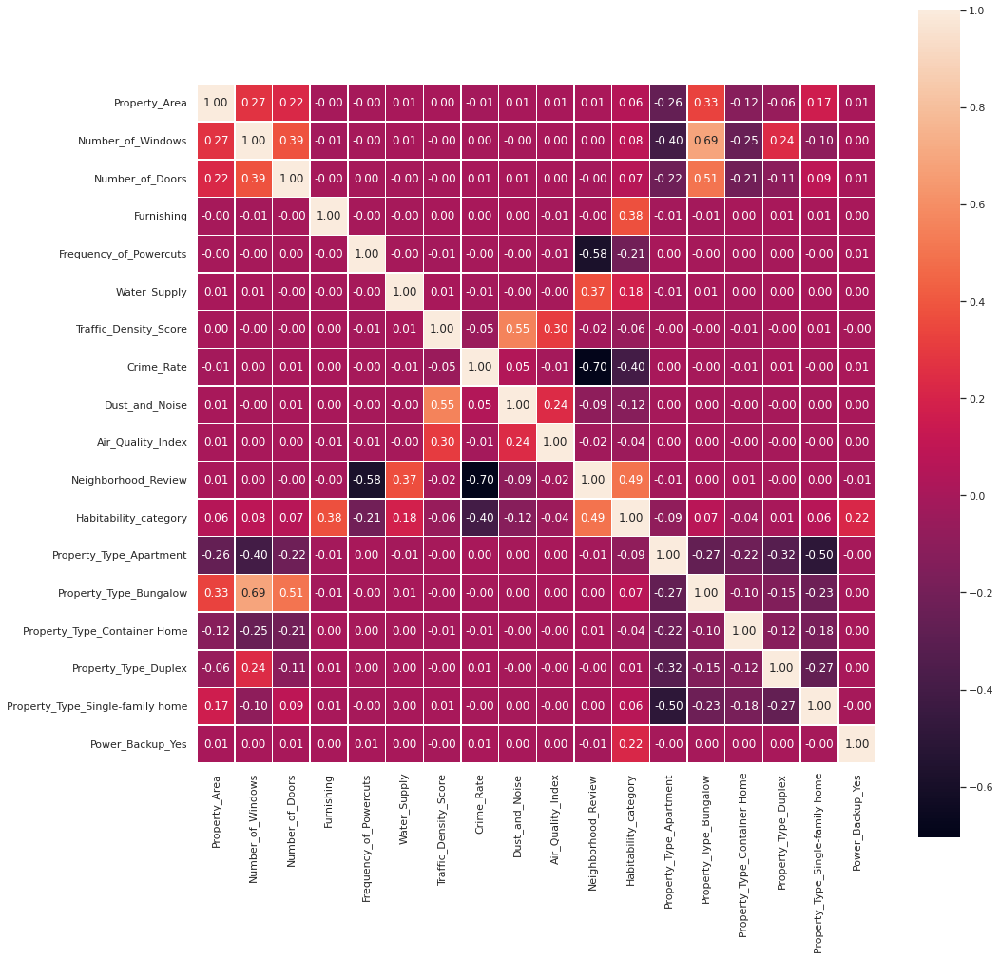

In [ ]:
fig, ax = plt.subplots(figsize=(16, 16))
sns.heatmap(data.corr(method='pearson'), annot=True, linewidths=.5, fmt= '.2f', square=True, ax=ax)
plt.show()

#### Separate features and labels

In [27]:
X = data.drop(['Neighborhood_Review', 'Habitability_category'], inplace=False, axis=1)
y_clas = data['Habitability_category']
y_regr = data['Neighborhood_Review']

In [28]:
print('Features')
display(X)
print('\nClassification label')
display(y_clas)
print('\nRegression label')
display(y_regr)

Features


,Property_Area,Number_of_Windows,Number_of_Doors,Furnishing,Frequency_of_Powercuts,Water_Supply,Traffic_Density_Score,Crime_Rate,Dust_and_Noise,Air_Quality_Index,Property_Type_Apartment,Property_Type_Bungalow,Property_Type_Container Home,Property_Type_Duplex,Property_Type_Single-family home,Power_Backup_Yes
0,106,3.927051,1,1.0,0.0,2.0,5.89,1.0,1.0,90.0,1,0,0,0,0,0
1,733,2.000000,2,0.0,1.0,1.0,4.37,0.0,1.0,96.0,1,0,0,0,0,0
2,737,4.000000,2,2.0,0.0,2.0,7.45,1.0,1.0,121.0,1,0,0,0,0,0
3,900,3.000000,2,0.0,2.0,2.0,6.16,3.0,1.0,100.0,1,0,0,0,0,1
4,2238,14.000000,6,2.0,0.0,3.0,5.46,0.0,1.0,116.0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39494,1120,3.000000,2,1.0,0.0,3.0,5.55,2.0,1.0,80.0,0,0,0,0,1,0
39495,445,1.000000,3,2.0,1.0,3.0,5.70,2.0,1.0,86.0,1,0,0,0,0,0
39496,3780,6.000000,6,0.0,0.0,0.0,6.84,0.0,1.0,137.0,0,1,0,0,0,1
39497,1266,3.000000,1,1.0,0.0,2.0,4.60,2.0,1.0,88.0,0,0,0,0,1,0



Classification label


0        2.0
1        2.0
2        2.0
3        0.0
4        2.0
        ... 
39494    2.0
39495    2.0
39496    2.0
39497    2.0
39498    2.0
Name: Habitability_category, Length: 37847, dtype: float64


Regression label


0        3.86
1        3.55
2        3.81
3        1.34
4        4.77
         ... 
39494    3.56
39495    2.93
39496    3.80
39497    3.25
39498    4.67
Name: Neighborhood_Review, Length: 37847, dtype: float64

#### Cross Validation

In [29]:
kf = StratifiedKFold(n_splits=8)

In [30]:
nkf = KFold(n_splits=8)

#### Data normalization

In [31]:
scaler = StandardScaler()
X_std = scaler.fit_transform(X)
X_std = pd.DataFrame(X_std, columns=X.columns)
X_std

,Property_Area,Number_of_Windows,Number_of_Doors,Furnishing,Frequency_of_Powercuts,Water_Supply,Traffic_Density_Score,Crime_Rate,Dust_and_Noise,Air_Quality_Index,Property_Type_Apartment,Property_Type_Bungalow,Property_Type_Container Home,Property_Type_Duplex,Property_Type_Single-family home,Power_Backup_Yes
0,-0.661989,0.000225,-1.128433,0.098343,-0.657058,-0.215971,-0.382733,0.286899,-0.079616,-0.504752,1.294248,-0.349224,-0.282271,-0.418557,-0.646258,-0.549478
1,-0.338634,-0.731833,-0.281661,-1.386289,0.697763,-1.297312,-1.628147,-0.818157,-0.079616,-0.408071,1.294248,-0.349224,-0.282271,-0.418557,-0.646258,-0.549478
2,-0.336572,0.027938,-0.281661,1.582974,-0.657058,-0.215971,0.895456,0.286899,-0.079616,-0.005233,1.294248,-0.349224,-0.282271,-0.418557,-0.646258,-0.549478
3,-0.252510,-0.351948,-0.281661,-1.386289,2.052584,-0.215971,-0.161508,2.497012,-0.079616,-0.343617,1.294248,-0.349224,-0.282271,-0.418557,-0.646258,1.819908
4,0.437520,3.826789,3.105427,1.582974,-0.657058,0.865370,-0.735054,-0.818157,-0.079616,-0.085801,-0.772649,2.863488,-0.282271,-0.418557,-0.646258,-0.549478
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37842,-0.139052,-0.351948,-0.281661,0.098343,-0.657058,0.865370,-0.661312,1.391956,-0.079616,-0.665887,-0.772649,-0.349224,-0.282271,-0.418557,1.547369,-0.549478
37843,-0.487161,-1.111718,0.565111,1.582974,0.697763,0.865370,-0.538409,1.391956,-0.079616,-0.569206,1.294248,-0.349224,-0.282271,-0.418557,-0.646258,-0.549478
37844,1.232757,0.787708,3.105427,-1.386289,-0.657058,-2.378653,0.395651,-0.818157,-0.079616,0.252583,-0.772649,2.863488,-0.282271,-0.418557,-0.646258,1.819908
37845,-0.063757,-0.351948,-1.128433,0.098343,-0.657058,-0.215971,-1.439696,1.391956,-0.079616,-0.536979,-0.772649,-0.349224,-0.282271,-0.418557,1.547369,-0.549478


In [32]:
X_std.describe()

,Property_Area,Number_of_Windows,Number_of_Doors,Furnishing,Frequency_of_Powercuts,Water_Supply,Traffic_Density_Score,Crime_Rate,Dust_and_Noise,Air_Quality_Index,Property_Type_Apartment,Property_Type_Bungalow,Property_Type_Container Home,Property_Type_Duplex,Property_Type_Single-family home,Power_Backup_Yes
count,3.784700e+04,3.784700e+04,3.784700e+04,3.784700e+04,3.784700e+04,3.784700e+04,3.784700e+04,3.784700e+04,3.784700e+04,3.784700e+04,3.784700e+04,3.784700e+04,3.784700e+04,3.784700e+04,3.784700e+04,3.784700e+04
mean,-4.346200e-17,6.214222e-17,-1.272883e-16,2.590824e-17,-1.051349e-17,1.971279e-16,-4.027041e-16,1.107671e-17,-1.879286e-16,-9.912716e-17,-1.301044e-16,-1.126445e-18,6.242383e-18,9.856394e-18,3.942558e-18,-9.387042e-18
std,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00
min,-6.650835e-01,-1.491603e+00,-1.128433e+00,-1.386289e+00,-6.570576e-01,-2.378653e+00,-5.208713e+00,-8.181568e-01,-2.816411e+00,-1.954968e+00,-7.726495e-01,-3.492245e-01,-2.822713e-01,-4.185573e-01,-6.462584e-01,-5.494783e-01
25%,-4.613751e-01,-7.318327e-01,-1.128433e+00,-1.386289e+00,-6.570576e-01,-2.159710e-01,-6.203446e-01,-8.181568e-01,-7.961560e-02,-4.241846e-01,-7.726495e-01,-3.492245e-01,-2.822713e-01,-4.185573e-01,-6.462584e-01,-5.494783e-01
50%,-2.354909e-01,2.251615e-04,-2.816607e-01,9.834259e-02,-6.570576e-01,-2.159710e-01,9.249123e-02,-8.181568e-01,-7.961560e-02,-1.341415e-01,-7.726495e-01,-3.492245e-01,-2.822713e-01,-4.185573e-01,-6.462584e-01,-5.494783e-01
75%,1.971960e-01,4.078227e-01,5.651113e-01,9.834259e-02,6.977630e-01,8.653699e-01,7.070049e-01,2.868994e-01,-7.961560e-02,3.009233e-01,1.294248e+00,-3.492245e-01,-2.822713e-01,-4.185573e-01,1.547369e+00,-5.494783e-01
max,1.375644e+01,4.206674e+00,3.105427e+00,1.582974e+00,3.407404e+00,8.653699e-01,2.911061e+00,2.497012e+00,2.657180e+00,1.486754e+01,1.294248e+00,2.863488e+00,3.542691e+00,2.389159e+00,1.547369e+00,1.819908e+00


#### Feature selection using PCA

##### PCA

In [33]:
pca = PCA()
X_pca = pca.fit_transform(X_std)
X_pca.shape

(37847, 16)

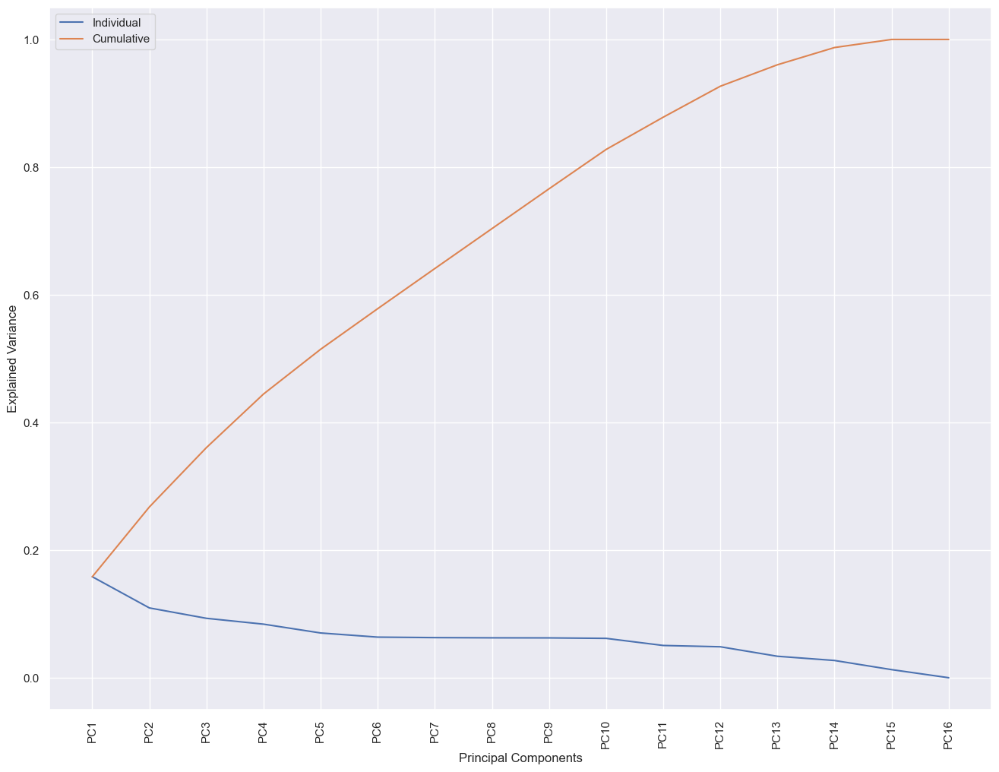

In [34]:
plt.figure(figsize=(16, 12))
plt.plot([f"PC{i}" for i in range(1, 17)], pca.explained_variance_ratio_)
plt.plot([f"PC{i}" for i in range(1, 17)], pca.explained_variance_ratio_.cumsum())
plt.xlabel("Principal Components")
plt.xticks(rotation=90)
plt.ylabel("Explained Variance")
plt.legend(['Individual', 'Cumulative'])
plt.show()

The graph above shows that the last principal component does not explain any variance, thus it can be removed to reduce a dimension with no loss of performance.

##### Dimension reduction

In [35]:
pca = PCA(n_components=15)
X_pca = pca.fit_transform(X_std)
X_pca.shape

(37847, 15)

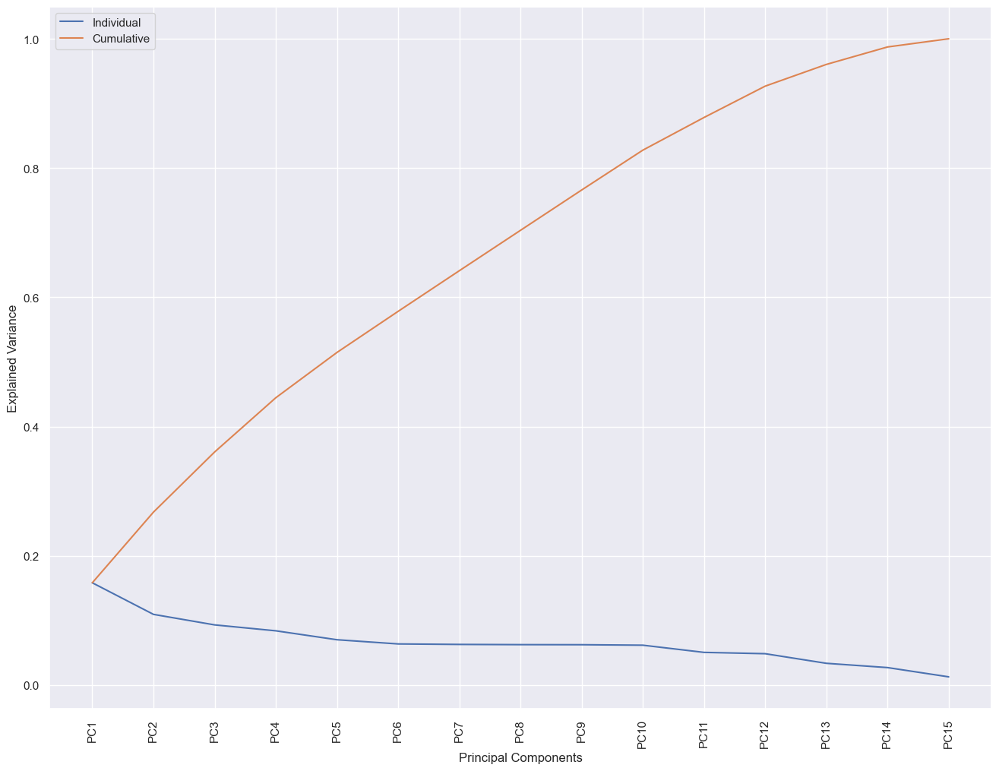

In [36]:
plt.figure(figsize=(16, 12))
plt.plot([f"PC{i}" for i in range(1, 16)], pca.explained_variance_ratio_)
plt.plot([f"PC{i}" for i in range(1, 16)], pca.explained_variance_ratio_.cumsum())
plt.xlabel("Principal Components")
plt.xticks(rotation=90)
plt.ylabel("Explained Variance")
plt.legend(['Individual', 'Cumulative'])
plt.show()

#### Train-test split

In [37]:
# Classification
X_clas_train_std, X_clas_test_std, y_clas_train_std, y_clas_test_std = train_test_split(X_std, y_clas, test_size=0.2, stratify=y_clas)
X_clas_train_pca, X_clas_test_pca, y_clas_train_pca, y_clas_test_pca = train_test_split(X_pca, y_clas, test_size=0.2, stratify=y_clas)

# Regression
X_regr_train_std, X_regr_test_std, y_regr_train_std, y_regr_test_std = train_test_split(X_std, y_regr, test_size=0.2)
X_regr_train_pca, X_regr_test_pca, y_regr_train_pca, y_regr_test_pca = train_test_split(X_pca, y_regr, test_size=0.2)

#### Data balancing

Viz of Habitability_category. The data here is very imbalanced, with the majority class in the 'High' habitability category.

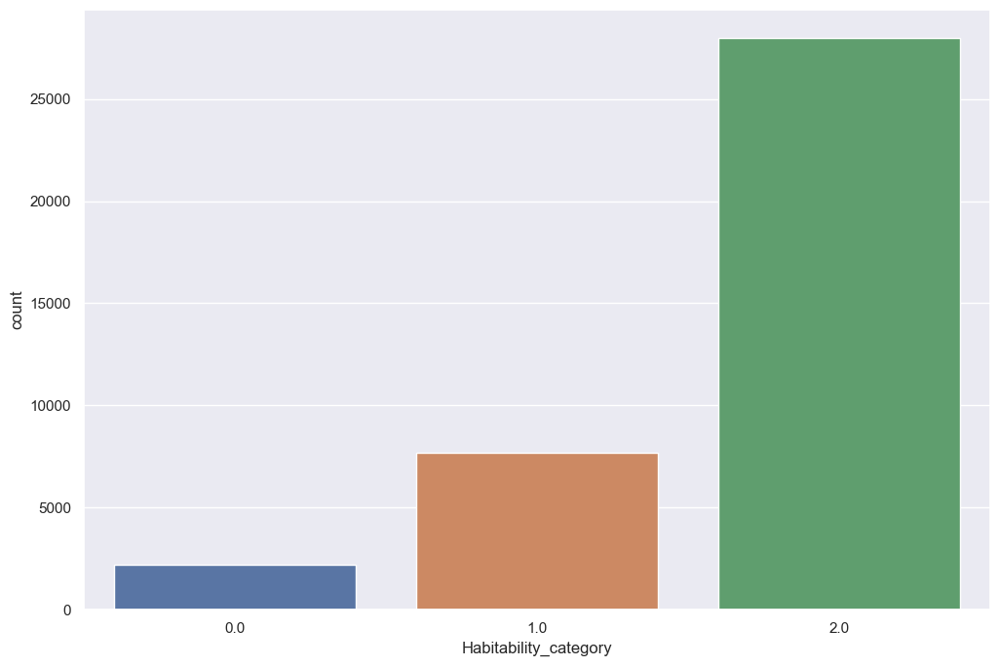

In [38]:
fig, ax = plt.subplots(figsize=(12, 8))
sns.countplot(x=y_clas)
plt.show()

#### Oversampling experiments (SVMSMOTE dan ADASYN)

In [39]:
smote_ovrsamp = SVMSMOTE()
adasyn_ovrsamp = ADASYN()

X_train_std_smote, y_clas_train_std_smote = smote_ovrsamp.fit_resample(X_clas_train_std, y_clas_train_std)
X_train_pca_smote, y_clas_train_pca_smote = smote_ovrsamp.fit_resample(X_clas_train_pca, y_clas_train_pca)

X_train_std_adasyn, y_clas_train_std_adasyn = adasyn_ovrsamp.fit_resample(X_clas_train_std, y_clas_train_std)
X_train_pca_adasyn, y_clas_train_pca_adasyn = adasyn_ovrsamp.fit_resample(X_clas_train_pca, y_clas_train_pca)

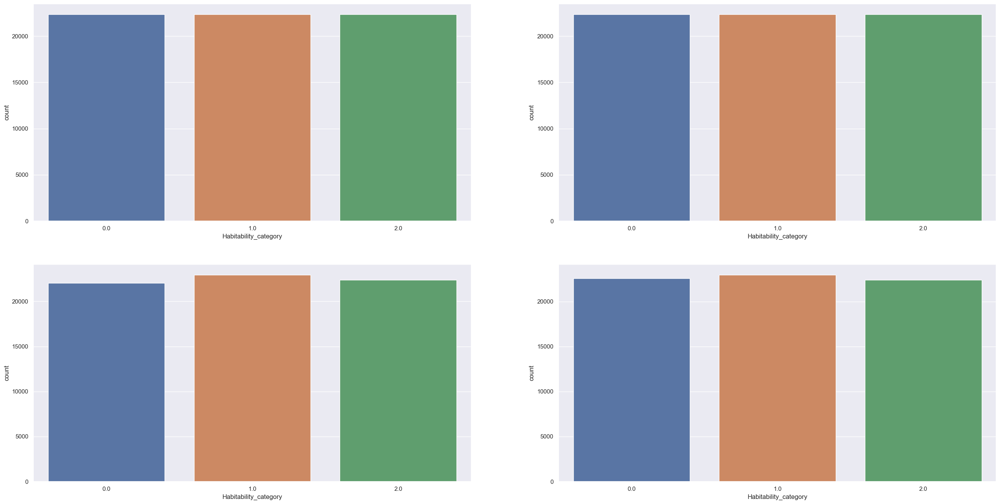

In [40]:
fig, ax = plt.subplots(figsize=(32, 16))
plt.subplot(221)
sns.countplot(x=y_clas_train_std_smote)
plt.subplot(222)
sns.countplot(x=y_clas_train_pca_smote)
plt.subplot(223)
sns.countplot(x=y_clas_train_std_adasyn)
plt.subplot(224)
sns.countplot(x=y_clas_train_pca_adasyn)
plt.show()

#### Undersampling experiments (Random Undersampling dan NearMiss-2)

In [41]:
undersample = RandomUnderSampler(sampling_strategy='not minority')
nearmiss = NearMiss(version=2)

X_train_std_under, y_clas_train_std_under = undersample.fit_resample(X_clas_train_std, y_clas_train_std)
X_train_pca_under, y_clas_train_pca_under = undersample.fit_resample(X_clas_train_pca, y_clas_train_pca)

X_train_std_nearmiss, y_clas_train_std_nearmiss = nearmiss.fit_resample(X_clas_train_std, y_clas_train_std)
X_train_pca_nearmiss, y_clas_train_pca_nearmiss = nearmiss.fit_resample(X_clas_train_pca, y_clas_train_pca)

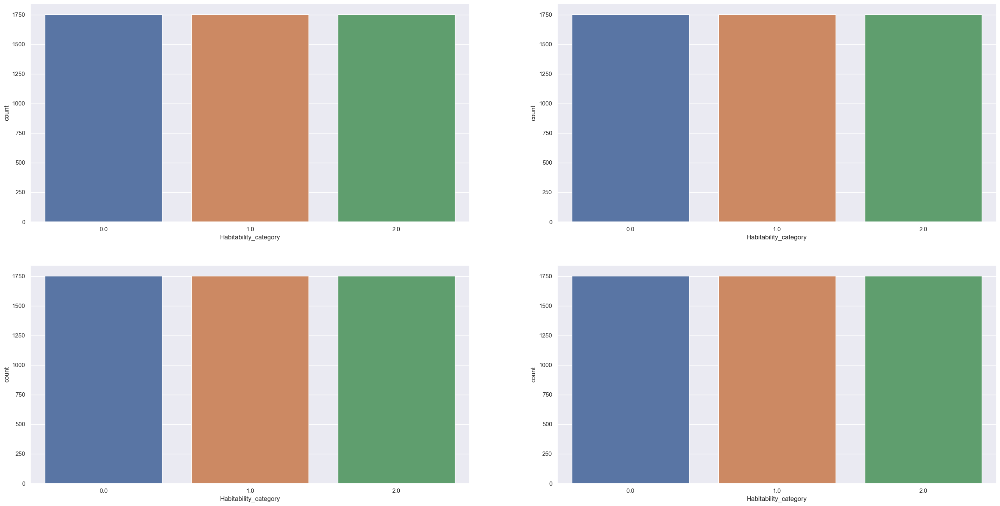

In [42]:
fig, ax = plt.subplots(figsize=(32, 16))
plt.subplot(221)
sns.countplot(x=y_clas_train_std_under)
plt.subplot(222)
sns.countplot(x=y_clas_train_pca_under)
plt.subplot(223)
sns.countplot(x=y_clas_train_std_nearmiss)
plt.subplot(224)
sns.countplot(x=y_clas_train_pca_nearmiss)
plt.show()

It can be seen that each class is now balanced after oversampling/undersampling.

### Classification with label Habitability_category

#### Experiments to find the best performing data

In [ ]:
test_model = nn.MLPClassifier(hidden_layer_sizes=(200, 100), early_stopping=True)

Before Balancing

In [ ]:
score_std_clas = cross_validate(test_model, X=X_clas_train_std, y=y_clas_train_std, cv=kf, scoring=('accuracy', 'f1_weighted'), n_jobs=-1)

In [ ]:
mean(score_std_clas['test_accuracy'])

0.8462200574762401

In [ ]:
mean(score_std_clas['test_f1_weighted'])

0.8377774077917617

In [ ]:
# Dengan PCA
score_pca_clas = cross_validate(test_model, X=X_clas_train_pca, y=y_clas_train_pca, cv=kf, scoring=('accuracy', 'f1_weighted'), n_jobs=-1)

In [ ]:
mean(score_pca_clas['test_accuracy'])

0.8431483916148366

In [ ]:
mean(score_pca_clas['test_f1_weighted'])

0.833938006203004

SVMSMOTE

In [ ]:
score_std_smote = cross_validate(test_model, X=X_train_std_smote, y=y_clas_train_std_smote, cv=kf, scoring=('accuracy', 'f1_weighted'), n_jobs=-1)

In [ ]:
mean(score_std_smote['test_accuracy'])

0.8826542957386931

In [ ]:
mean(score_std_smote['test_f1_weighted'])

0.8824040127266832

In [ ]:
# Dengan PCA
score_pca_smote = cross_validate(test_model, X=X_train_pca_smote, y=y_clas_train_pca_smote, cv=kf, scoring=('accuracy', 'f1_weighted'), n_jobs=-1)

In [ ]:
mean(score_pca_smote['test_accuracy'])

0.8904446678224058

In [ ]:
mean(score_pca_smote['test_f1_weighted'])

0.8904522283204401

ADASYN

In [ ]:
score_std_adasyn = cross_validate(test_model, X=X_train_std_adasyn, y=y_clas_train_std_adasyn, cv=kf, scoring=('accuracy', 'f1_weighted'), n_jobs=-1)

In [ ]:
mean(score_std_adasyn['test_accuracy'])

0.8760629502775481

In [ ]:
mean(score_std_adasyn['test_f1_weighted'])

0.8755834600338013

In [ ]:
# Dengan PCA
score_pca_adasyn = cross_validate(test_model, X=X_train_pca_adasyn, y=y_clas_train_pca_adasyn, cv=kf, scoring=('accuracy', 'f1_weighted'), n_jobs=-1)

In [ ]:
mean(score_pca_adasyn['test_accuracy'])

0.8788679579544112

In [ ]:
mean(score_pca_adasyn['test_f1_weighted'])

0.8782329782670816

Random Undersampling

In [ ]:
score_std_under = cross_validate(test_model, X=X_train_std_under, y=y_clas_train_std_under, cv=kf, scoring=('accuracy', 'f1_weighted'), n_jobs=-1)

In [ ]:
mean(score_std_under['test_accuracy'])

0.787401366544796

In [ ]:
mean(score_std_under['test_f1_weighted'])

0.7779603643762083

In [ ]:
# Dengan PCA
score_pca_under = cross_validate(test_model, X=X_train_pca_under, y=y_clas_train_pca_under, cv=kf, scoring=('accuracy', 'f1_weighted'), n_jobs=-1)

In [ ]:
mean(score_pca_under['test_accuracy'])

0.7808707429436634

In [ ]:
mean(score_pca_under['test_f1_weighted'])

0.773537398919132

NearMiss

In [ ]:
score_std_nearmiss = cross_validate(test_model, X=X_train_std_nearmiss, y=y_clas_train_std_nearmiss, cv=kf, scoring=('accuracy', 'f1_weighted'), n_jobs=-1)

In [ ]:
mean(score_std_nearmiss['test_accuracy'])

0.7995517064301676

In [ ]:
mean(score_std_nearmiss['test_f1_weighted'])

0.7980447092774756

In [ ]:
# Dengan PCA
score_pca_nearmiss = cross_validate(test_model, X=X_train_pca_nearmiss, y=y_clas_train_pca_nearmiss, cv=kf, scoring=('accuracy', 'f1_weighted'), n_jobs=-1)

In [ ]:
mean(score_pca_nearmiss['test_accuracy'])

0.8098155588865295

In [ ]:
mean(score_pca_nearmiss['test_f1_weighted'])

0.8093421170881052

From the experiments above, the best performing data is the one that's been normalized, PCA'd, and oversampled using SVM SMOTE, with the highest weighted f1-score.

#### AdaBoost

In [ ]:
randforest = RandomForestClassifier(criterion='entropy', n_estimators=64, n_jobs=-1)
randforest.fit(X_train_pca_smote, y_clas_train_pca_smote)

knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train_pca_smote, y_clas_train_pca_smote)

KNeighborsClassifier(n_neighbors=1)

In [ ]:
ada = AdaBoostClassifier()

param_dist = {
  'n_estimators': [32, 64, 128],
  'learning_rate': [0.5, 1.0, 2.0]
}

gs_ada = HalvingGridSearchCV(ada, param_dist, scoring="accuracy", cv=kf, verbose=2, n_jobs=-1).fit(X_train_pca_smote, y_clas_train_pca_smote)

n_iterations: 3
n_required_iterations: 3
n_possible_iterations: 3
min_resources_: 7459
max_resources_: 67135
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 9
n_resources: 7459
Fitting 8 folds for each of 9 candidates, totalling 72 fits
----------
iter: 1
n_candidates: 3
n_resources: 22377
Fitting 8 folds for each of 3 candidates, totalling 24 fits
----------
iter: 2
n_candidates: 1
n_resources: 67131
Fitting 8 folds for each of 1 candidates, totalling 8 fits


In [49]:
print(f'Best hyperparameters: {gs_ada.best_estimator_}\n')
print(f'with an accuracy score of {gs_ada.best_score_}')

Best hyperparameters: AdaBoostClassifier(learning_rate=0.5, n_estimators=128)

with an accuracy score of 0.8323625375334746


In [ ]:
ada = gs_ada.best_estimator_
ada.fit(X_train_pca_smote, y_clas_train_pca_smote)

AdaBoostClassifier(learning_rate=0.5, n_estimators=128)

In [ ]:
pred = ada.predict(X_clas_test_pca)
print(classification_report(y_clas_test_pca, pred, zero_division='warn', digits=5))
display(pd.crosstab(y_clas_test_pca, pred))

              precision    recall  f1-score   support

         0.0    0.89952   0.89936   0.89944      5594
         1.0    0.74113   0.78749   0.76360      5595
         2.0    0.87953   0.82466   0.85121      5595

    accuracy                        0.83717     16784
   macro avg    0.84006   0.83717   0.83808     16784
weighted avg    0.84005   0.83717   0.83808     16784



col_0,0.00,1.00,2.00
Habitability_category,,,
0.00,5031,560,3
1.00,560,4406,629
2.00,2,979,4614


#### Random Forest

In [ ]:
randforest = RandomForestClassifier()

param_dist = {
    'criterion': ['gini', 'entropy'],
    'min_samples_split': [2, 5, 20, 50],
    'max_depth': [2, 5, 12, 16, None],
    'min_samples_leaf': [1, 2],
    'n_estimators': [64],
    'n_jobs': [-1]
}

gs_randforest = HalvingGridSearchCV(randforest, param_dist, cv=kf, scoring='accuracy', n_jobs=-1, verbose=2).fit(X_train_pca_smote, y_clas_train_pca_smote)

n_iterations: 4
n_required_iterations: 4
n_possible_iterations: 4
min_resources_: 2486
max_resources_: 67135
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 80
n_resources: 2486
Fitting 8 folds for each of 80 candidates, totalling 640 fits
----------
iter: 1
n_candidates: 27
n_resources: 7458
Fitting 8 folds for each of 27 candidates, totalling 216 fits
----------
iter: 2
n_candidates: 9
n_resources: 22374
Fitting 8 folds for each of 9 candidates, totalling 72 fits
----------
iter: 3
n_candidates: 3
n_resources: 67122
Fitting 8 folds for each of 3 candidates, totalling 24 fits


In [60]:
print(f'Best hyperparameters: {gs_randforest.best_estimator_}\n')
print(f'with an accuracy score of {gs_randforest.best_score_}')

Best hyperparameters: RandomForestClassifier(criterion='entropy', n_estimators=64, n_jobs=-1)

with an accuracy score of 0.9163575563152326


In [ ]:
randforest = RandomForestClassifier()

param_dist = {
    'criterion': ['entropy'],
    'n_estimators': [64, 128, 256],
    'n_jobs': [-1]
}

gs_randforest = HalvingGridSearchCV(randforest, param_dist, cv=kf, scoring='accuracy', n_jobs=-1, verbose=2).fit(X_train_pca_smote, y_clas_train_pca_smote)

n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 22378
max_resources_: 67135
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3
n_resources: 22378
Fitting 8 folds for each of 3 candidates, totalling 24 fits
----------
iter: 1
n_candidates: 1
n_resources: 67134
Fitting 8 folds for each of 1 candidates, totalling 8 fits


In [61]:
print(f'Best hyperparameters: {gs_randforest.best_estimator_}\n')
print(f'with an accuracy score of {gs_randforest.best_score_}')

Best hyperparameters: RandomForestClassifier(criterion='entropy', n_estimators=256, n_jobs=-1)

with an accuracy score of 0.9183041410649273


It seems that the accuracy score doesn't improve significantly with the increase of number of trees on the random forest model above. A 5x2 CV paired t-test ([Dietterich, 1998](https://sci2s.ugr.es/keel/pdf/algorithm/articulo/dietterich1998.pdf)) with a level of significance α = 0.01 can be done to test this hypothesis,

In [ ]:
randforest256 = RandomForestClassifier(criterion='entropy', n_estimators=256, n_jobs=-1)
randforest256.fit(X_train_pca_smote, y_clas_train_pca_smote)

RandomForestClassifier(criterion='entropy', n_estimators=256, n_jobs=-1)

In [ ]:
randforest = RandomForestClassifier(criterion='entropy', n_estimators=64, n_jobs=-1)
randforest.fit(X_train_pca_smote, y_clas_train_pca_smote)

RandomForestClassifier(criterion='entropy', n_estimators=64, n_jobs=-1)

In [ ]:
t, p = paired_ttest_5x2cv(
    estimator1=randforest,
    estimator2=randforest256,
    X=X_pca_smote, 
    y=y_clas_pca_smote,
    scoring='accuracy'
)

print('t statistic: %.3f' % t)
print('p value: %.3f' % p)

t statistic: -2.738
p value: 0.041


As p > α, the null hypothesis cannot be rejected (The accuracy scores of both models do not differ significantly).

In [ ]:
pred = randforest.predict(X_clas_test_pca)
print(classification_report(y_clas_test_pca, pred, zero_division='warn', digits=5))
display(pd.crosstab(y_clas_test_pca, pred))

              precision    recall  f1-score   support

         0.0    0.97197   0.99178   0.98178      5595
         1.0    0.87535   0.89882   0.88693      5594
         2.0    0.92272   0.87918   0.90042      5595

    accuracy                        0.92326     16784
   macro avg    0.92335   0.92326   0.92304     16784
weighted avg    0.92335   0.92326   0.92304     16784



col_0,0.00,1.00,2.00
Habitability_category,,,
0.00,5549,43,3
1.00,157,5028,409
2.00,3,673,4919


#### MLP

In [ ]:
mlp = nn.MLPClassifier()

param_dist = {
    'hidden_layer_sizes': [(256, 128), (256, 128, 64), (128, 128, 128), (256, 128, 64, 32), (128, 128, 64, 64)],
    'activation': ['logistic', 'tanh', 'relu'],
    'batch_size': [32, 64, 128, 256],
    'learning_rate_init': [0.01, 0.05, 0.001],
    'early_stopping': [True]
}

gs_mlp = HalvingGridSearchCV(mlp, param_dist, cv=kf, scoring='accuracy', n_jobs=-1).fit(X_train_pca_smote, y_clas_train_pca_smote)

In [66]:
print(f'Best hyperparameters: {gs_mlp.best_estimator_}\n')
print(f'with an accuracy score of {gs_mlp.best_score_}')

Best hyperparameters: MLPClassifier(activation='tanh', batch_size=64, early_stopping=True,
              hidden_layer_sizes=(256, 128, 64, 32))

with an accuracy score of 0.9016149699829104


In [ ]:
mlp = gs_mlp.best_estimator_
mlp.fit(X_train_pca_smote, y_clas_train_pca_smote)

MLPClassifier(activation='tanh', batch_size=64, early_stopping=True,
              hidden_layer_sizes=(256, 128, 64, 32))

In [ ]:
pred = mlp.predict(X_clas_test_pca)
print(classification_report(y_clas_test_pca, pred, zero_division='warn', digits=5))
display(pd.crosstab(y_clas_test_pca, pred))

              precision    recall  f1-score   support

         0.0    0.98064   0.98677   0.98370      5595
         1.0    0.85457   0.87397   0.86416      5594
         2.0    0.88864   0.86291   0.87559      5595

    accuracy                        0.90789     16784
   macro avg    0.90795   0.90789   0.90782     16784
weighted avg    0.90795   0.90789   0.90782     16784



col_0,0.00,1.00,2.00
Habitability_category,,,
0.00,5521,70,4
1.00,104,4889,601
2.00,5,762,4828


#### Naive Bayes

In [ ]:
bayes = GaussianNB()
bayes.fit(X_train_pca_smote, y_clas_train_pca_smote)

GaussianNB()

In [ ]:
pred = bayes.predict(X_clas_test_pca)
print(classification_report(y_clas_test_pca, pred, zero_division='warn', digits=5))
display(pd.crosstab(y_clas_test_pca, pred))

              precision    recall  f1-score   support

         0.0    0.78075   0.92350   0.84615      5595
         1.0    0.66693   0.60708   0.63560      5594
         2.0    0.83090   0.75353   0.79033      5595

    accuracy                        0.76138     16784
   macro avg    0.75953   0.76137   0.75736     16784
weighted avg    0.75953   0.76138   0.75736     16784



col_0,0.00,1.00,2.00
Habitability_category,,,
0.00,5167,400,28
1.00,1368,3396,830
2.00,83,1296,4216


#### KNN

In [ ]:
knn = KNeighborsClassifier()

param_dist = {
      "n_neighbors": [1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 20, 30, 40],
      "p": [1, 2, 3, 5, 7]
}

gs_knn = HalvingGridSearchCV(knn, param_dist, scoring="accuracy", cv=kf, verbose=2, n_jobs=-1)
gs_knn.fit(X_train_pca_smote, y_clas_train_pca_smote)
gs_knn.best_params_

n_iterations: 5
n_required_iterations: 5
n_possible_iterations: 5
min_resources_: 828
max_resources_: 67135
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 85
n_resources: 828
Fitting 8 folds for each of 85 candidates, totalling 680 fits
----------
iter: 1
n_candidates: 29
n_resources: 2484
Fitting 8 folds for each of 29 candidates, totalling 232 fits
----------
iter: 2
n_candidates: 10
n_resources: 7452
Fitting 8 folds for each of 10 candidates, totalling 80 fits
----------
iter: 3
n_candidates: 4
n_resources: 22356
Fitting 8 folds for each of 4 candidates, totalling 32 fits
----------
iter: 4
n_candidates: 2
n_resources: 67068
Fitting 8 folds for each of 2 candidates, totalling 16 fits


{'n_neighbors': 1, 'p': 2}

In [69]:
print(f'Best hyperparameters: {gs_knn.best_estimator_}\n')
print(f'with an accuracy score of {gs_knn.best_score_}')

Best hyperparameters: KNeighborsClassifier(n_neighbors=1)

with an accuracy score of 0.9219689377153255


In [ ]:
knn = gs_knn.best_estimator_
knn.fit(X_train_pca_smote, y_clas_train_pca_smote)

KNeighborsClassifier(n_neighbors=1)

In [ ]:
pred = knn.predict(X_clas_test_pca)
print(classification_report(y_clas_test_pca, pred, zero_division='warn', digits=5))
display(pd.crosstab(y_clas_test_pca, pred))

              precision    recall  f1-score   support

         0.0    0.98723   0.99535   0.99128      5594
         1.0    0.86644   0.92761   0.89599      5595
         2.0    0.93190   0.85845   0.89366      5595

    accuracy                        0.92713     16784
   macro avg    0.92853   0.92714   0.92698     16784
weighted avg    0.92852   0.92713   0.92697     16784



col_0,0.00,1.00,2.00
Habitability_category,,,
0.00,5568,23,3
1.00,57,5190,348
2.00,15,777,4803


#### Summary

- AdaBoost
  - Learning rate = 0.5
  - Max. 128 trees 
  - Weighted f1-score = 0.83808
- Random Forest
  - 64 trees
  - Uses entropy as the cost criterion
  - Weighted f1-score = 0.92304
- MLP
  - 4 hidden layers, each with 256, 128, 64, and 32 neurons
  - Uses the Adam optimizer
  - tanh as the activation function
  - Minibatch size = 64
  - Initial learning rate = 0.001
  - Does early stopping
  - Weighted f1-score = 0.90782
- Naive Bayes
  - Gaussian
  - Weighted f1-score = 0.75736
- KNN
  - k = 1
  - Uses the Euclidean metric
  - Weighted f1-score = 0.92698

The KNN model is the clear winner here, giving the highest weighted f1-score score among all the classifiers and only using a k value of 1, making its big-O complexity small.

Next, a 5x2 CV paired t-test ([Dietterich, 1998](https://sci2s.ugr.es/keel/pdf/algorithm/articulo/dietterich1998.pdf)) with a level of significance α = 0.01 is done to obtain the statistical significance of the difference between the weighted f1-score of the KNN model and the other models,

In [ ]:
t, p = paired_ttest_5x2cv(
    estimator1=randforest,
    estimator2=knn,
    X=X_train_pca_smote, 
    y=y_clas_train_pca_smote,
    scoring='f1_weighted'
)

print('t statistic: %.3f' % t)
print('p value: %.3f' % p)

t statistic: -1.276
p value: 0.258


In [ ]:
t, p = paired_ttest_5x2cv(
    estimator1=ada,
    estimator2=knn,
    X=X_train_pca_smote, 
    y=y_clas_train_pca_smote,
    scoring='f1_weighted'
)

print('t statistic: %.3f' % t)
print('p value: %.3f' % p)

t statistic: -18.664
p value: 0.000


In [ ]:
t, p = paired_ttest_5x2cv(
    estimator1=mlp,
    estimator2=knn,
    X=X_train_pca_smote, 
    y=y_clas_train_pca_smote,
    scoring='f1_weighted'
)

print('t statistic: %.3f' % t)
print('p value: %.3f' % p)

t statistic: -4.881
p value: 0.005


In [ ]:
t, p = paired_ttest_5x2cv(
    estimator1=bayes,
    estimator2=knn,
    X=X_train_pca_smote, 
    y=y_clas_train_pca_smote,
    scoring='f1_weighted'
)

print('t statistic: %.3f' % t)
print('p value: %.3f' % p)

t statistic: -27.568
p value: 0.000


From the results above, it can be seen that p > α only for the test between the KNN model and the Random Forest model, whereas with the other models p < α, meaning only the weighted f1-scores of the KNN model and the Random Forest model that are not significantly different. Therefore, in addition to the KNN model, the Random Forest model is also suitable for use, but it should be noted that the Random Forest model performs slower due to the large number of trees it uses.

### Regression with label Neighborhood_Review

#### Experiments to find the best performing data

In [ ]:
test_model = nn.MLPRegressor(hidden_layer_sizes=(64, 32), early_stopping=True)

In [ ]:
score_std_regr = cross_validate(test_model, X=X_regr_train_std, y=y_regr_train_std, cv=nkf, n_jobs=-1)

In [ ]:
mean(score_std_regr['test_score'])

0.967166919836403

In [ ]:
score_pca_regr = cross_validate(test_model, X=X_regr_train_pca, y=y_regr_train_pca, cv=nkf, n_jobs=-1)

In [ ]:
mean(score_pca_regr['test_score'])

0.9671754733781625

It can be seen that the difference in scores between the normalized and the PCA'd data is not much different, the latter is preferable since it has smaller dimensions.

#### Linear Regression

In [ ]:
linear = LinearRegression()
linear.fit(X_regr_train_pca, y_regr_train_pca)

LinearRegression()

In [ ]:
y_linear_predict_pca = linear.predict(X_regr_test_pca)

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


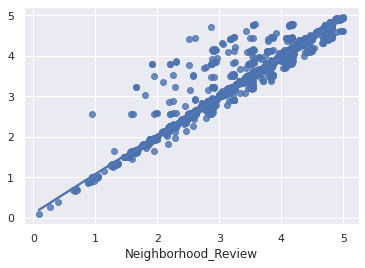

In [ ]:
sns.regplot(y_regr_test_pca, y_linear_predict_pca)

In [ ]:
print("MSE:", metrics.mean_squared_error(y_regr_test_pca, y_linear_predict_pca))
print("MAE:", metrics.mean_absolute_error(y_regr_test_pca, y_linear_predict_pca))
print("RMSE: ", math.sqrt(metrics.mean_squared_error(y_regr_test_pca, y_linear_predict_pca))) 
print("R-squared:", metrics.r2_score(y_regr_test_pca, y_linear_predict_pca))

MSE: 0.01813479343502811
MAE: 0.045423814020412484
RMSE:  0.1346654871710941
R-squared: 0.9718132537447325


#### Ridge Regression

In [ ]:
alpha = [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.25, 0.5, 1]

In [ ]:
ridreg = Ridge()

param_dist = {
    'alpha': alpha
}

gs_ridreg = HalvingGridSearchCV(ridreg, param_dist, cv=nkf, n_jobs=-1, verbose=2).fit(X_regr_train_pca, y_regr_train_pca)

n_iterations: 3
n_required_iterations: 3
n_possible_iterations: 3
min_resources_: 3364
max_resources_: 30277
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 10
n_resources: 3364
Fitting 8 folds for each of 10 candidates, totalling 80 fits
----------
iter: 1
n_candidates: 4
n_resources: 10092
Fitting 8 folds for each of 4 candidates, totalling 32 fits
----------
iter: 2
n_candidates: 2
n_resources: 30276
Fitting 8 folds for each of 2 candidates, totalling 16 fits


In [73]:
print(f'Best hyperparameters: {gs_ridreg.best_estimator_}\n')
print(f'with an accuracy score of {gs_ridreg.best_score_}')

Best hyperparameters: Ridge(alpha=0.005)

with an accuracy score of 0.9684414302569841


In [ ]:
ridreg = Ridge()

param_dist = {
    'alpha': [0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.009]
}

gs_ridreg = HalvingGridSearchCV(ridreg, param_dist, cv=nkf, n_jobs=-1, verbose=2).fit(X_regr_train_pca, y_regr_train_pca)

n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 10092
max_resources_: 30277
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 8
n_resources: 10092
Fitting 8 folds for each of 8 candidates, totalling 64 fits
----------
iter: 1
n_candidates: 3
n_resources: 30276
Fitting 8 folds for each of 3 candidates, totalling 24 fits


In [74]:
print(f'Best hyperparameters: {gs_ridreg.best_estimator_}\n')
print(f'with an accuracy score of {gs_ridreg.best_score_}')

Best hyperparameters: Ridge(alpha=0.004)

with an accuracy score of 0.9684170894600038


In [ ]:
ridreg = gs_ridreg.best_estimator_
y_ridreg_predict_pca = ridreg.predict(X_regr_test_pca)

In [ ]:
print("MSE:", metrics.mean_squared_error(y_regr_test_pca, y_ridreg_predict_pca))
print("MAE:", metrics.mean_absolute_error(y_regr_test_pca, y_ridreg_predict_pca))
print("RMSE: ", math.sqrt(metrics.mean_squared_error(y_regr_test_pca, y_ridreg_predict_pca))) 
print("R-squared:", metrics.r2_score(y_regr_test_pca, y_ridreg_predict_pca))

MSE: 0.018134793823405493
MAE: 0.04542382759715614
RMSE:  0.13466548861310196
R-squared: 0.971813253141081


#### Lasso Regression

In [ ]:
alpha = [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.25, 0.5, 1]

In [ ]:
lasreg = Lasso()

param_dist = {
    'alpha': alpha
}

gs_lasreg = HalvingGridSearchCV(lasreg, param_dist, cv=nkf, n_jobs=-1, verbose=2).fit(X_regr_train_pca, y_regr_train_pca)

n_iterations: 3
n_required_iterations: 3
n_possible_iterations: 3
min_resources_: 3364
max_resources_: 30277
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 10
n_resources: 3364
Fitting 8 folds for each of 10 candidates, totalling 80 fits
----------
iter: 1
n_candidates: 4
n_resources: 10092
Fitting 8 folds for each of 4 candidates, totalling 32 fits
----------
iter: 2
n_candidates: 2
n_resources: 30276
Fitting 8 folds for each of 2 candidates, totalling 16 fits


In [75]:
print(f'Best hyperparameters: {gs_lasreg.best_estimator_}\n')
print(f'with an accuracy score of {gs_lasreg.best_score_}')

Best hyperparameters: Lasso(alpha=0.0005)

with an accuracy score of 0.9678334745015253


In [ ]:
lasreg = Lasso()

param_dist = {
    'alpha': [0.0002, 0.0003, 0.0004, 0.0005, 0.0006, 0.0007, 0.0008, 0.0009]
}

gs_lasreg = HalvingGridSearchCV(lasreg, param_dist, cv=nkf, n_jobs=-1, verbose=2).fit(X_regr_train_pca, y_regr_train_pca)

n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 10092
max_resources_: 30277
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 8
n_resources: 10092
Fitting 8 folds for each of 8 candidates, totalling 64 fits
----------
iter: 1
n_candidates: 3
n_resources: 30276
Fitting 8 folds for each of 3 candidates, totalling 24 fits


In [76]:
print(f'Best hyperparameters: {gs_lasreg.best_estimator_}\n')
print(f'with an accuracy score of {gs_lasreg.best_score_}')

Best hyperparameters: Lasso(alpha=0.0002)

with an accuracy score of 0.9678362398153606


In [ ]:
lasreg = gs_lasreg.best_estimator_
y_lasreg_predict_pca = lasreg.predict(X_regr_test_pca)

In [ ]:
print("MSE:", metrics.mean_squared_error(y_regr_test_pca, y_lasreg_predict_pca))
print("MAE:", metrics.mean_absolute_error(y_regr_test_pca, y_lasreg_predict_pca))
print("RMSE: ", math.sqrt(metrics.mean_squared_error(y_regr_test_pca, y_lasreg_predict_pca))) 
print("R-squared:", metrics.r2_score(y_regr_test_pca, y_lasreg_predict_pca))

MSE: 0.016224759690868017
MAE: 0.044659601898629706
RMSE:  0.1273764487292216
R-squared: 0.9742852610953074


#### MLP

In [ ]:
mlprr = nn.MLPRegressor()

param_dist = {
    'hidden_layer_sizes': [(256, 128, 64, 32), (128, 128, 128, 128)],
    'activation': ['logistic', 'tanh', 'relu'],
    'batch_size': [32, 64, 128, 256],
    'learning_rate_init': [0.01, 0.05, 0.001],
    'early_stopping': [True]
}

gs_mlprr = HalvingGridSearchCV(mlprr, param_dist, cv=nkf, n_jobs=-1, verbose=2).fit(X_regr_train_pca, y_regr_train_pca)

n_iterations: 4
n_required_iterations: 4
n_possible_iterations: 4
min_resources_: 1121
max_resources_: 30277
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 72
n_resources: 1121
Fitting 8 folds for each of 72 candidates, totalling 576 fits
----------
iter: 1
n_candidates: 24
n_resources: 3363
Fitting 8 folds for each of 24 candidates, totalling 192 fits
----------
iter: 2
n_candidates: 8
n_resources: 10089
Fitting 8 folds for each of 8 candidates, totalling 64 fits
----------
iter: 3
n_candidates: 3
n_resources: 30267
Fitting 8 folds for each of 3 candidates, totalling 24 fits


In [78]:
print(f'Best hyperparameters: {gs_mlprr.best_estimator_}\n')
print(f'with an accuracy score of {gs_mlprr.best_score_}')

Best hyperparameters: MLPRegressor(activation='logistic', batch_size=256, early_stopping=True,
             hidden_layer_sizes=(128, 128, 128, 128))

with an accuracy score of 0.9685553210626467


In [ ]:
mlpregr = gs_mlprr.best_estimator_

mlpregr.fit(X_regr_train_pca, y_regr_train_pca)

MLPRegressor(activation='logistic', batch_size=256, early_stopping=True,
             hidden_layer_sizes=(128, 128, 128, 128))

In [ ]:
pred = mlpregr.predict(X_regr_test_pca)

print("MSE:", metrics.mean_squared_error(y_regr_test_pca, pred))
print("MAE:", metrics.mean_absolute_error(y_regr_test_pca, pred))
print("RMSE: ", math.sqrt(metrics.mean_squared_error(y_regr_test_pca, pred))) 
print("R-squared:", metrics.r2_score(y_regr_test_pca, pred))

MSE: 0.015887518809978147
MAE: 0.03406113474898045
RMSE:  0.12604570127528406
R-squared: 0.9748197566049669


#### Random Forest

In [ ]:
randforestregr = RandomForestRegressor()

param_dist = {
    'criterion': ['absolute_error', 'poisson', 'squared_error', 'friedman_mse'],
    'min_samples_split': [2, 5, 20, 50],
    'max_depth' : [2, 5, 12, 16, 20, None],
    'min_samples_leaf': [1, 2],
    'n_estimators': [64],
    'n_jobs': [-1]
}

gs_randforestregr = HalvingGridSearchCV(randforestregr, param_dist, cv=nkf, n_jobs=-1, verbose=2).fit(X_regr_train_pca, y_regr_train_pca)

n_iterations: 5
n_required_iterations: 5
n_possible_iterations: 5
min_resources_: 373
max_resources_: 30277
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 192
n_resources: 373
Fitting 8 folds for each of 192 candidates, totalling 1536 fits
----------
iter: 1
n_candidates: 64
n_resources: 1119
Fitting 8 folds for each of 64 candidates, totalling 512 fits
----------
iter: 2
n_candidates: 22
n_resources: 3357
Fitting 8 folds for each of 22 candidates, totalling 176 fits
----------
iter: 3
n_candidates: 8
n_resources: 10071
Fitting 8 folds for each of 8 candidates, totalling 64 fits
----------
iter: 4
n_candidates: 3
n_resources: 30213
Fitting 8 folds for each of 3 candidates, totalling 24 fits


In [79]:
print(f'Best hyperparameters: {gs_randforestregr.best_estimator_}\n')
print(f'with an accuracy score of {gs_randforestregr.best_score_}')

Best hyperparameters: RandomForestRegressor(max_depth=16, min_samples_leaf=2, min_samples_split=5,
                      n_estimators=64, n_jobs=-1)

with an accuracy score of 0.9617879262845157


In [ ]:
randforestregr = gs_randforestregr.best_estimator_
randforestregr.fit(X_regr_train_pca, y_regr_train_pca)

RandomForestRegressor(max_depth=16, min_samples_leaf=2, min_samples_split=5,
                      n_estimators=64, n_jobs=-1)

In [ ]:
pred = randforestregr.predict(X_regr_test_pca)

print("MSE:", metrics.mean_squared_error(y_regr_test_pca, pred))
print("MAE:", metrics.mean_absolute_error(y_regr_test_pca, pred))
print("RMSE: ", math.sqrt(metrics.mean_squared_error(y_regr_test_pca, pred))) 
print("R-squared:", metrics.r2_score(y_regr_test_pca, pred))

MSE: 0.019412502189361712
MAE: 0.04912240502614634
RMSE:  0.13932875578774725
R-squared: 0.9692329849688207


#### Summary

- Linear Regression
  - MSE: 0.01813479343502811
  - MAE: 0.045423814020412484
  - RMSE:  0.1346654871710941
  - R-squared: 0.9718132537447325
- Ridge Regression
  - alpha = 0.004
  - MSE: 0.018134793823405493
  - MAE: 0.04542382759715614
  - RMSE:  0.13466548861310196
  - R-squared: 0.971813253141081
- Lasso Regression
  - alpha = 0.0002
  - MSE: 0.016224759690868017
  - MAE: 0.044659601898629706
  - RMSE:  0.1273764487292216
  - R-squared: 0.9742852610953074
- MLP
  - 4 hidden layers, each with 128, 128, 128, 128 neurons
  - Logistic activation function
  - Minibatch size of 256
  - Does early stopping
  - MSE: 0.015887518809978147
  - MAE: 0.03406113474898045
  - RMSE:  0.12604570127528406
  - R-squared: 0.9748197566049669
- Random Forest
  - 64 trees
  - max_depth = 16
  - min_samples_leaf = 2
  - min_samples_split = 5
  - MSE: 0.019412502189361712
  - MAE: 0.04912240502614634
  - RMSE:  0.13932875578774725
  - R-squared: 0.9692329849688207

From the results shown above, it might seem that the MLP performed the best with the highest R-squared score, but due to its sheer complexity, a simpler model such as the Lasso Regressor may be preferable.

It can be shown by using a 5x2 CV paired t-test ([Dietterich, 1998](https://sci2s.ugr.es/keel/pdf/algorithm/articulo/dietterich1998.pdf)) with a level of significance α = 0.01 that the difference in R-squared score of the Lasso model compared to the MLP, Linear, and Ridge is not significant enough.

In [ ]:
t, p = paired_ttest_5x2cv(
    estimator1=mlpregr,
    estimator2=lasreg,
    X=X_pca, 
    y=y_regr
)

print('t statistic: %.3f' % t)
print('p value: %.3f' % p)

t statistic: 3.369
p value: 0.020


In [ ]:
t, p = paired_ttest_5x2cv(
    estimator1=ridreg,
    estimator2=lasreg,
    X=X_pca, 
    y=y_regr
)

print('t statistic: %.3f' % t)
print('p value: %.3f' % p)

t statistic: 0.128
p value: 0.903


In [ ]:
t, p = paired_ttest_5x2cv(
    estimator1=randforestregr,
    estimator2=lasreg,
    X=X_pca, 
    y=y_regr
)

print('t statistic: %.3f' % t)
print('p value: %.3f' % p)

t statistic: -13.672
p value: 0.000


In [ ]:
t, p = paired_ttest_5x2cv(
    estimator1=linear,
    estimator2=lasreg,
    X=X_pca, 
    y=y_regr
)

print('t statistic: %.3f' % t)
print('p value: %.3f' % p)

t statistic: 0.818
p value: 0.450


From the results above, it can be seen that p > α for test between the Lasso model and the Linear model, Ridge model, or MLP model, while p < α for the Random Forest model, meaning that only the R-Squared scores of the Lasso model, the Linear model, the MLP model, and the Ridge model are not significantly different. So apart from the Lasso model, the Ridge model, Linear model, and the MLP model are also suitable for use.

The Lasso model is still recommended over the others because its regularization term reduces the value of the weights and can even eliminate some.

### Clustering

#### Data Preparation for Clustering

##### Removal of target column (property type)

In [ ]:
cdata = data.copy()
cdata

,Property_Area,Number_of_Windows,Number_of_Doors,Furnishing,Frequency_of_Powercuts,Water_Supply,Traffic_Density_Score,Crime_Rate,Dust_and_Noise,Air_Quality_Index,Neighborhood_Review,Habitability_category,Property_Type_Apartment,Property_Type_Bungalow,Property_Type_Container Home,Property_Type_Duplex,Property_Type_Single-family home,Power_Backup_Yes
0,106,3.927051,1,1.0,0.0,2.0,5.89,1.0,1.0,90.0,3.86,2.0,1,0,0,0,0,0
1,733,2.000000,2,0.0,1.0,1.0,4.37,0.0,1.0,96.0,3.55,2.0,1,0,0,0,0,0
2,737,4.000000,2,2.0,0.0,2.0,7.45,1.0,1.0,121.0,3.81,2.0,1,0,0,0,0,0
3,900,3.000000,2,0.0,2.0,2.0,6.16,3.0,1.0,100.0,1.34,0.0,1,0,0,0,0,1
4,2238,14.000000,6,2.0,0.0,3.0,5.46,0.0,1.0,116.0,4.77,2.0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39494,1120,3.000000,2,1.0,0.0,3.0,5.55,2.0,1.0,80.0,3.56,2.0,0,0,0,0,1,0
39495,445,1.000000,3,2.0,1.0,3.0,5.70,2.0,1.0,86.0,2.93,2.0,1,0,0,0,0,0
39496,3780,6.000000,6,0.0,0.0,0.0,6.84,0.0,1.0,137.0,3.80,2.0,0,1,0,0,0,1
39497,1266,3.000000,1,1.0,0.0,2.0,4.60,2.0,1.0,88.0,3.25,2.0,0,0,0,0,1,0


##### Data normalization

In [ ]:
scaler = StandardScaler()
cdata_std = scaler.fit_transform(cdata)
cdata_std = pd.DataFrame(cdata_std, columns=cdata.columns)
cdata_std

,Property_Area,Number_of_Windows,Number_of_Doors,Furnishing,Frequency_of_Powercuts,Water_Supply,Traffic_Density_Score,Crime_Rate,Dust_and_Noise,Air_Quality_Index,Neighborhood_Review,Habitability_category,Property_Type_Apartment,Property_Type_Bungalow,Property_Type_Container Home,Property_Type_Duplex,Property_Type_Single-family home,Power_Backup_Yes
0,-0.661989,0.000225,-1.128433,0.098343,-0.657058,-0.215971,-0.382733,0.286899,-0.079616,-0.504752,0.156215,0.552473,1.294248,-0.349224,-0.282271,-0.418557,-0.646258,-0.549478
1,-0.338634,-0.731833,-0.281661,-1.386289,0.697763,-1.297312,-1.628147,-0.818157,-0.079616,-0.408071,-0.232601,0.552473,1.294248,-0.349224,-0.282271,-0.418557,-0.646258,-0.549478
2,-0.336572,0.027938,-0.281661,1.582974,-0.657058,-0.215971,0.895456,0.286899,-0.079616,-0.005233,0.093503,0.552473,1.294248,-0.349224,-0.282271,-0.418557,-0.646258,-0.549478
3,-0.252510,-0.351948,-0.281661,-1.386289,2.052584,-0.215971,-0.161508,2.497012,-0.079616,-0.343617,-3.004489,-2.913661,1.294248,-0.349224,-0.282271,-0.418557,-0.646258,1.819908
4,0.437520,3.826789,3.105427,1.582974,-0.657058,0.865370,-0.735054,-0.818157,-0.079616,-0.085801,1.297581,0.552473,-0.772649,2.863488,-0.282271,-0.418557,-0.646258,-0.549478
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37842,-0.139052,-0.351948,-0.281661,0.098343,-0.657058,0.865370,-0.661312,1.391956,-0.079616,-0.665887,-0.220059,0.552473,-0.772649,-0.349224,-0.282271,-0.418557,1.547369,-0.549478
37843,-0.487161,-1.111718,0.565111,1.582974,0.697763,0.865370,-0.538409,1.391956,-0.079616,-0.569206,-1.010235,0.552473,1.294248,-0.349224,-0.282271,-0.418557,-0.646258,-0.549478
37844,1.232757,0.787708,3.105427,-1.386289,-0.657058,-2.378653,0.395651,-0.818157,-0.079616,0.252583,0.080961,0.552473,-0.772649,2.863488,-0.282271,-0.418557,-0.646258,1.819908
37845,-0.063757,-0.351948,-1.128433,0.098343,-0.657058,-0.215971,-1.439696,1.391956,-0.079616,-0.536979,-0.608876,0.552473,-0.772649,-0.349224,-0.282271,-0.418557,1.547369,-0.549478


##### Dimension reduction

In [ ]:
pca = PCA(n_components=2)
cdata_pca = pca.fit_transform(cdata_std)
cdata_pca = pd.DataFrame(data=cdata_pca, columns=[f"PCA-{i}" for i in range(1,3)])
cdata_pca.to_numpy()

array([[-1.055102  , -0.95638929],
       [-1.19936914, -0.45246879],
       [-0.58974405, -0.75109574],
       ...,
       [ 3.59343834,  1.48228418],
       [-0.49756695,  0.1435259 ],
       [ 1.0452219 , -1.1134845 ]])

#### KMeans Clustering 

[Reference](https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html)

K-Means Clustering using PCA

For n_clusters = 2 The average silhouette_coefficient is : 0.5164803296159385
For n_clusters = 3 The average silhouette_coefficient is : 0.4649163995866532
For n_clusters = 4 The average silhouette_coefficient is : 0.39683976441297336
For n_clusters = 5 The average silhouette_coefficient is : 0.39109816308531675
For n_clusters = 6 The average silhouette_coefficient is : 0.40128659566771213
For n_clusters = 7 The average silhouette_coefficient is : 0.40239860128447275
For n_clusters = 8 The average silhouette_coefficient is : 0.3940664867205979
For n_clusters = 9 The average silhouette_coefficient is : 0.38941979193887877
For n_clusters = 10 The average silhouette_coefficient is : 0.3707062215465768


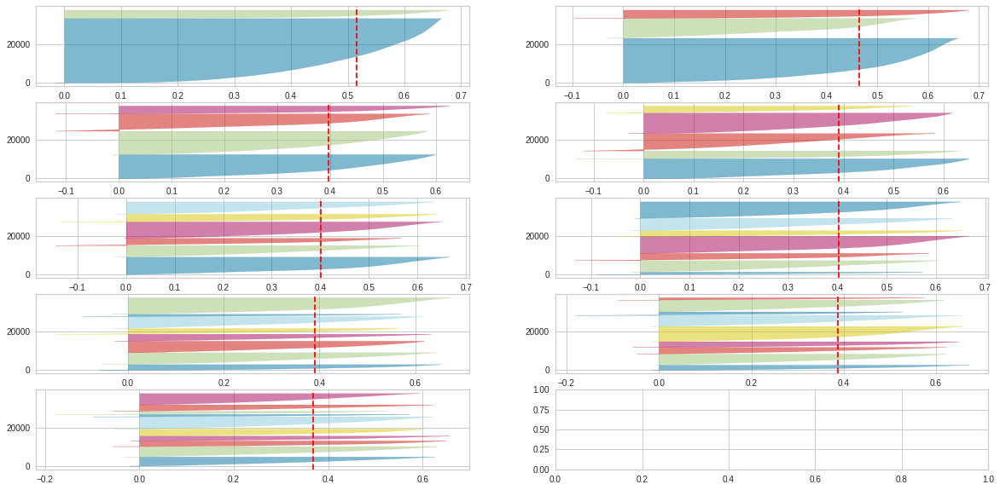

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.metrics import silhouette_samples, silhouette_score

fig, ax = plt.subplots(5, 2, figsize=(20,10))
for k in [2, 3, 4, 5, 6, 7, 8, 9, 10]:
    # Create KMeans instance for different number of clusters
    clusterer = KMeans(n_clusters = k)

    # Draw silhouette diagram
    q, mod = divmod(k, 2)
    visualizer = SilhouetteVisualizer(clusterer, colors = 'yellowbrick', ax = ax[q-1][mod])
    visualizer.fit(cdata_pca)

    # Compute silhoutte score
    # This gives a perspective into the density and separation of the formed clusters
    cluster_labels = clusterer.fit_predict(cdata_pca)
    silhouette_avg = silhouette_score(cdata_pca, cluster_labels)
    print(
        "For n_clusters =",
        k,
        "The average silhouette_coefficient is :",
        silhouette_avg,
    )

In [ ]:
kmeans = KMeans(n_clusters=2)
cluster_assignment = kmeans.fit_predict(cdata_pca)

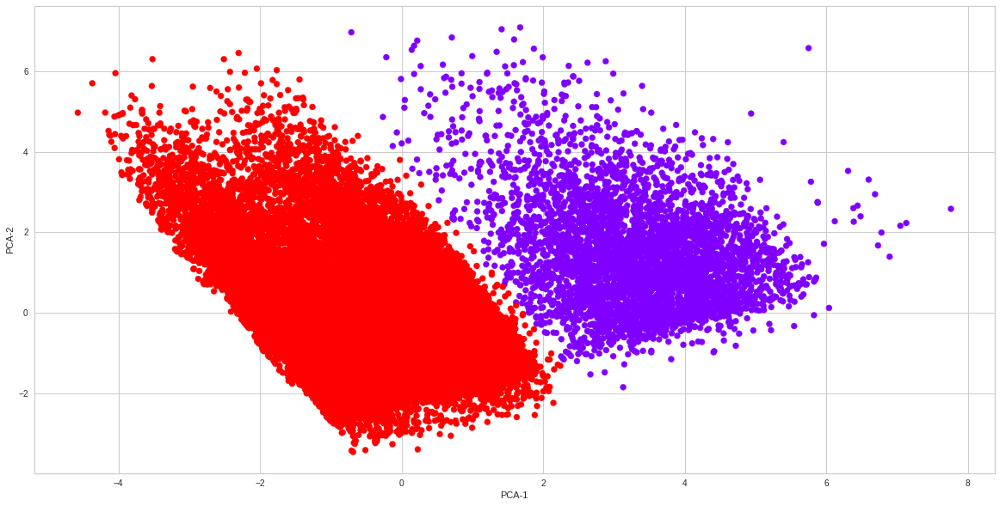

In [ ]:
fig, ax = plt.subplots(figsize=(20, 10))
x = cdata_pca['PCA-1']
y = cdata_pca['PCA-2']
ax.scatter(x, y, c=cluster_assignment, cmap='rainbow')
ax.set_xlabel('PCA-1')
ax.set_ylabel('PCA-2')
plt.show()

In [ ]:
data_with_cluster = cdata.copy()
data_with_cluster['Cluster'] = cluster_assignment

# Return encoded data for analysis
data_with_cluster.drop([
    "Property_Type_Apartment",
    "Property_Type_Bungalow",
    "Property_Type_Container Home",
    "Property_Type_Duplex",
    "Property_Type_Single-family home",
], inplace=True, axis=1)
data_with_cluster['Property_Type'] = data_raw['Property_Type'] # This column is safe
data_with_cluster

,Property_Area,Number_of_Windows,Number_of_Doors,Furnishing,Frequency_of_Powercuts,Water_Supply,Traffic_Density_Score,Crime_Rate,Dust_and_Noise,Air_Quality_Index,Neighborhood_Review,Habitability_category,Power_Backup_Yes,Cluster,Property_Type
0,106,3.927051,1,1.0,0.0,2.0,5.89,1.0,1.0,90.0,3.86,2.0,0,1,Apartment
1,733,2.000000,2,0.0,1.0,1.0,4.37,0.0,1.0,96.0,3.55,2.0,0,1,Apartment
2,737,4.000000,2,2.0,0.0,2.0,7.45,1.0,1.0,121.0,3.81,2.0,0,1,Apartment
3,900,3.000000,2,0.0,2.0,2.0,6.16,3.0,1.0,100.0,1.34,0.0,1,1,Apartment
4,2238,14.000000,6,2.0,0.0,3.0,5.46,0.0,1.0,116.0,4.77,2.0,0,0,Bungalow
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39494,1120,3.000000,2,1.0,0.0,3.0,5.55,2.0,1.0,80.0,3.56,2.0,0,1,Single-family home
39495,445,1.000000,3,2.0,1.0,3.0,5.70,2.0,1.0,86.0,2.93,2.0,0,1,Apartment
39496,3780,6.000000,6,0.0,0.0,0.0,6.84,0.0,1.0,137.0,3.80,2.0,1,0,Bungalow
39497,1266,3.000000,1,1.0,0.0,2.0,4.60,2.0,1.0,88.0,3.25,2.0,0,1,Single-family home


In [ ]:
cluster_1 = data_with_cluster.loc[data_with_cluster["Cluster"] == 0]
cluster_2 = data_with_cluster.loc[data_with_cluster["Cluster"] == 1]
property_type_1 = cluster_1["Property_Type"].value_counts()
property_type_2 = cluster_2["Property_Type"].value_counts()

arr = [[],
       []
       ]
types = data_with_cluster["Property_Type"].unique()
for i in types:
  arr[0].append(property_type_1[i])
  arr[1].append(property_type_2[i])

properti_tiap_cluster = pd.DataFrame(arr, columns=types
                                     , index=["Cluster_1", "Cluster_2"])
properti_tiap_cluster

,Apartment,Bungalow,Single-family home,Duplex,Container Home
Cluster_1,59,4111,125,86,10
Cluster_2,14089,3,11025,5556,2783


It can be seen that the first cluster has the dominant property type, namely **Bungalow**, while the second cluster is dominated by the **Apartment** property type.

K-Means clustering without using PCA

In [ ]:
from sklearn import preprocessing
from sklearn.cluster import KMeans

# Choose features for clustering
X_clustering = data[['Traffic_Density_Score','Air_Quality_Index']]

# Normalize features
X_clustering = preprocessing.normalize(X_clustering)
X_clustering

array([[0.06530474, 0.99786537],
       [0.04547374, 0.99896553],
       [0.06145388, 0.99810992],
       ...,
       [0.0498649 , 0.99875597],
       [0.05220146, 0.99863657],
       [0.06267954, 0.9980337 ]])

For n_clusters = 2 The average silhouette_coefficient is : 0.9779334860372487
For n_clusters = 3 The average silhouette_coefficient is : 0.9559270022128505
For n_clusters = 4 The average silhouette_coefficient is : 0.5870141361912646
For n_clusters = 5 The average silhouette_coefficient is : 0.5875141559717226
For n_clusters = 6 The average silhouette_coefficient is : 0.5852034069989897


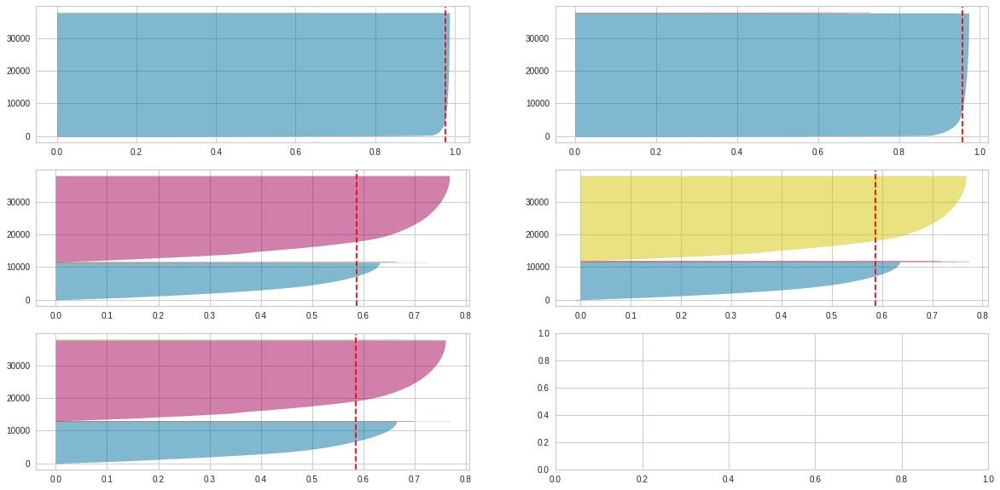

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.metrics import silhouette_samples, silhouette_score

fig, ax = plt.subplots(3, 2, figsize=(20,10))
for k in [2, 3, 4, 5, 6]:
    # Create KMeans instance for different number of clusters
    clusterer = KMeans(n_clusters = k)

    # Draw silhouette diagram
    q, mod = divmod(k, 2)
    visualizer = SilhouetteVisualizer(clusterer, colors = 'yellowbrick', ax = ax[q-1][mod])
    visualizer.fit(X_clustering)

    # Compute silhoutte score
    # This gives a perspective into the density and separation of the formed clusters
    cluster_labels = clusterer.fit_predict(X_clustering)
    silhouette_avg = silhouette_score(X_clustering, cluster_labels)
    print(
        "For n_clusters =",
        k,
        "The average silhouette_coefficient is :",
        silhouette_avg,
    )

In [ ]:
kmeans = KMeans(n_clusters=2)
cluster_assignment = kmeans.fit_predict(X_clustering)
data_with_clusters = pd.DataFrame(X_clustering.copy(), columns=('Air_Quality_Index', 'Traffic_Density_Score'))
data_with_clusters['Clusters'] = cluster_assignment 
data_with_clusters['Clusters'].value_counts()

0    37736
1      111
Name: Clusters, dtype: int64

In [ ]:
import plotly.express as px
fig = px.scatter(data_with_clusters, x="Air_Quality_Index", y="Traffic_Density_Score", color="Clusters")
fig.show()

#### Hierarchical Clustering

In [ ]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc

model  = AgglomerativeClustering(distance_threshold = 0, n_clusters = None, linkage = 'ward', affinity = 'euclidean')  
clustering = model.fit(X_clustering)
clustering.labels_

array([37846, 37845, 37844, ...,     6,     2,     0], dtype=int64)

In [ ]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    shc.dendrogram(linkage_matrix, **kwargs)

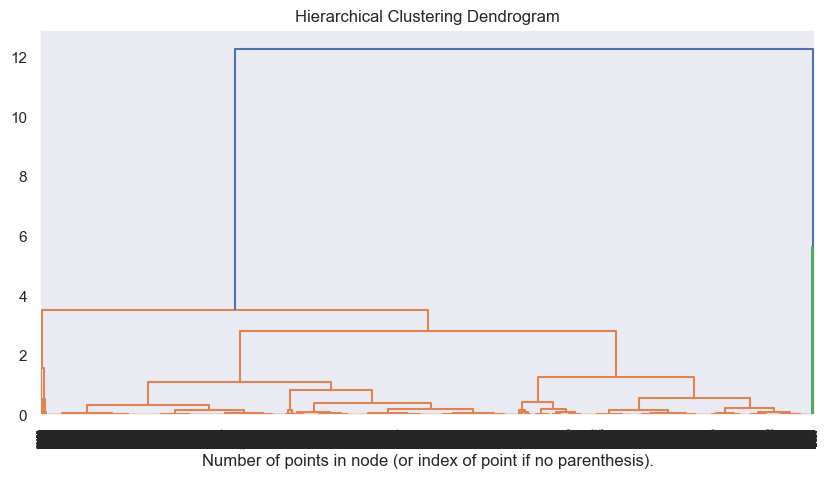

In [ ]:
plt.figure(figsize=(10, 5)) 
plt.grid(False)
plot_dendrogram(model, truncate_mode=None)
plt.title("Hierarchical Clustering Dendrogram")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

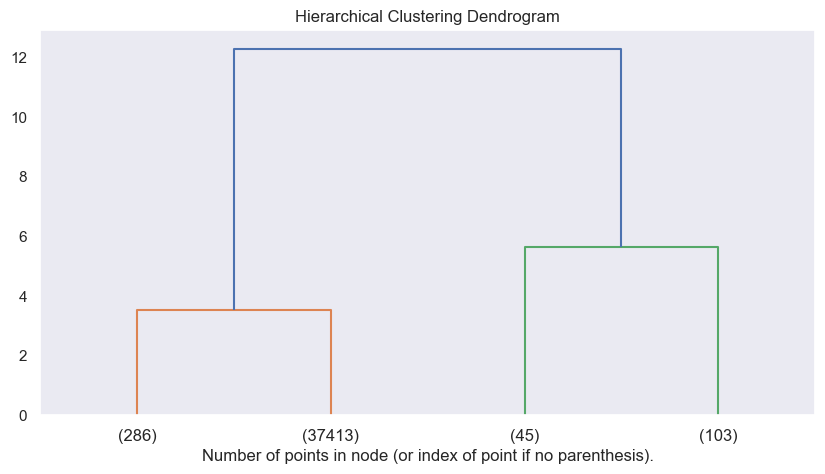

In [ ]:
plt.figure(figsize=(10, 5)) 
plt.grid(False)
plot_dendrogram(model, truncate_mode="level", p=1)
plt.title("Hierarchical Clustering Dendrogram")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.axhline(y = 150, color = 'black', linestyle = 'dashed')
plt.show()

In [ ]:
clustering = AgglomerativeClustering(n_clusters=2, linkage='ward', affinity='euclidean')  
cluster_assignment_2 = clustering.fit_predict(X_clustering)

In [ ]:
data_with_clusters_2 = pd.DataFrame(X_clustering.copy(), columns=('Air_Quality_Index', 'Traffic_Density_Score'))
data_with_clusters_2['Clusters'] = cluster_assignment_2
data_with_clusters_2['Clusters'].value_counts()

1    37699
0      148
Name: Clusters, dtype: int64

In [ ]:
import plotly.express as px
fig = px.scatter(data_with_clusters_2, x="Air_Quality_Index", y="Traffic_Density_Score", color="Clusters")
fig.show()

In [ ]:
from sklearn.metrics import silhouette_samples, silhouette_score
silhouette_avg = silhouette_score(X_clustering, cluster_assignment_2)
print(silhouette_avg)

0.9747759500227705


The results above suggest that most properties have a high traffic density and a low air quality index. Only a handful of people own properties where the air quality is high and there is low traffic density.